# Lab4_MIA_BME_23_24_Group11

<br>
<br>
<center>Medical Image Analysis: Lab 4 Deep Learning in medical imaging</center>

<center>Group 11</center>

## Contributions

- Enrique Almazán Sánchez: loading, pre-processing images and data augmentation and their correspoding explanations. Transfer learning with DenseNet169 and development of personalized model with its respective explanations.
- Guillermo Ots Rodríguez: transfer learning with ResNet and respective explanation.
- Javier Alfonso Villoldo Fernández: loading, pre-processing images, data augmentation and their correspoding explanations. Transfer learning with VGG16, VGG16 and DenseNet169 explanation.

## Objectives

The goal of this Laboratory is to become familiar with Convolutional Neural Networks that have been covered in class and to gain a deeper understanding of the fundamental underlying procedures and their applicability to medical image classification and segmentation tasks. 

Several already trained architectures will be loaded and modifyed to fit our objective in order to put in practice the so called 'Transfer Learning'.

Additionally we will work on the implementation of our own network. We think this is a good approach as it will improve our network design skills and provide a better understanding of the effect of hyperparameters.

We will apply these networks to real 2D brain CT slices to classify them into two classes, depending on the presence of bleeding or not. We have a database of 200 images. One hundred of them are healthy brains labeled with a value of 0, and 100 have bleeding, so they are labeled with value 1.

Results will be evaluated on the training and testing sets, assesing how well the algorithm achieves with evaluation metrics such as binary cross-entropy.

## Dependencies (required libraries)
The required denpendencies or libraries for this project are the following ones:

- **NumPy (Numerical Python)**: fundamental library for numerical computing in Python. It provides support for large, multi-dimensional arrays and matrices, along with a wide range of mathematical functions to operate on these arrays efficiently.


- **matplotlib.pyplot (Matplotlib's Pyplot Module)**: powerful library for creating static, animated, or interactive visualizations in Python. The pyplot module provides a simple and MATLAB-like interface for creating plots and charts.


- **OpenCV (cv2)**: OpenCV (Open Source Computer Vision Library) is a library dedicated to computer vision and image processing tasks. It offers a wide range of functions for image analysis, including image filtering, object detection and feature extraction.


- **scikit-image (skimage)**: an image processing library built on top of SciPy and NumPy. It provides tools and algorithms for a wide range of image processing tasks, making it useful for tasks such as feature extraction and image enhancement.


- **SciPy**: a scientific library that builds on NumPy and provides additional functionality for scientific and technical computing. It includes tools for optimization, signal processing, statistical analysis, and more.


- **Nibabel**: library used for reading and writing neuroimaging file formats, such as NIfTI and ANALYZE. It provides a convenient interface for working with these data formats in the field of neuroimaging research and analysis.


- **TensorFlow:** TensorFlow is an open-source machine learning library. It is widely used for building and training machine learning and deep learning models. TensorFlow provides a flexible platform for constructing neural networks and other machine learning models, and it supports various deployment scenarios, including on CPUs, GPUs, and TPUs. The library offers tools and abstractions for tasks such as neural network architecture design, model training, and deployment, making it a popular choice for both researchers and practitioners in the field of machine learning.
    - **Keras:** Keras is an open-source high-level neural networks API capable of running on top of TensorFlow, Theano, or Microsoft Cognitive Toolkit (CNTK). Keras serves as a user-friendly interface for building and experimenting with deep learning models. It simplifies the process of designing neural networks by providing a concise and expressive syntax, allowing developers to focus on model architecture and experimentation rather than low-level implementation details. Keras is often used in conjunction with TensorFlow, providing a high-level abstraction that facilitates rapid prototyping and development of deep learning models.


### Imports

In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import random

import tqdm
from tqdm import tqdm

import tensorflow as tf
import tensorflow.keras.backend as K

# Acceso a directorios
import os

# Visualizar imágenes
import matplotlib.pyplot as plt
import seaborn as sn
from skimage.io import imread, imshow
import cv2

# Preprocesamiento de las imágenes
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Creación de los modelos
from tensorflow.keras.applications.densenet import DenseNet169
from tensorflow.keras.applications.resnet50 import ResNet50
from keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras import layers, models
from keras.optimizers import SGD
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import InputLayer, BatchNormalization, Dropout, Flatten, Dense, MaxPool2D, Conv2D

# Compilación de los modelos
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.optimizers import Adam

# Hyperparameter tuning
import keras_tuner
from keras_tuner import Hyperband
from keras_tuner import RandomSearch

tf.random.set_seed(20)

# 1. Personalized functions

First of all we present the personalized functions that are going to help us during this lab practice.<br>
These functions will be implemented for **preprocessing of the images**, for the **evaluation of the model** with specifically created metrics, as well as for **metric plots** showing how the values of the metrics change as the models go through epochs, and for **comparison of predictions** with the corresponding true labels.

## Resizing the images

This function takes a list of input images and resizes each image to the specified target size using OpenCV. The desired_size parameter allows you to set the height and width to which the images should be resized. The function returns a list containing the resized images.

In [2]:
def preprocess_image(images, desired_size=(224, 224)):
    """
    Resize a list of images to the desired size.

    Parameters:
    - images (list): List of input images.
    - desired_size (tuple): Target size for resizing (height, width).

    Output:
    - resized_images (list): List of resized images.
    """
    
    # Create list of resized images
    resized_images = []
    for image in images:
        # Resize image to the desired size
        image = cv2.resize(image, desired_size)
        # Normalize intensity values to the range [0, 1]
        image = image / np.max(image) # according to maxmium pizel value of the image
        # Append to empty list
        resized_images.append(image)
    return resized_images

## Custom metrics

In [3]:
# Define a custom metric for Accuracy
def custom_accuracy(y_true, y_pred):
    return K.mean(K.equal(K.round(y_true), K.round(y_pred)))

# Define a custom metric for Precision
def custom_precision(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

# Define a custom metric for Recall
def custom_recall(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

# Define a custom metric for Specificity
def custom_specificity(y_true, y_pred):
    true_negatives = K.sum(K.round(K.clip((1 - y_true) * (1 - y_pred), 0, 1)))
    possible_negatives = K.sum(K.round(K.clip(1 - y_true, 0, 1)))
    specificity = true_negatives / (possible_negatives + K.epsilon())
    return specificity

# Define a custom metric for F1-Score
def custom_f1_score(y_true, y_pred):
    precision = custom_precision(y_true, y_pred)
    recall = custom_recall(y_true, y_pred)
    return 2 * (precision * recall) / (precision + recall + K.epsilon())


## Plot of the metrics

In [4]:
def plot_metrics (history, method='all metrics'):
    """Graphically represents the training and validation metrics stored in a Keras history object.

    Args:
    - history: Keras history object containing training and validation metrics.

    Returns:
    - No return value, but displays graphs of the metrics in two subplots for each metric."""
    
    if method == 'all metrics':
        # Get training metrics
        training_metrics = [metric for metric in history.history.keys() if not metric.startswith('val_')]

        plt.figure(figsize=(12, 6))

        for metric in training_metrics:
            index = training_metrics.index(metric) + 1
            train_metric = history.history[str(metric)]

            # Get validation metric
            validation_metric = 'val_' + str(metric)
            val_metric = history.history[validation_metric]

            # Create subplots for each metric        
            plt.subplot(2, 3, index)

            plt.plot(train_metric, label=metric)
            plt.plot(val_metric, label=validation_metric)

            # Graph metrics
            plt.ylabel(metric)
            plt.xlabel('Epochs')
            plt.title(f'Training and Validation {metric}')
            plt.legend(loc='lower center')
            
        plt.tight_layout()    
        plt.show()
        
    else:
        metric = method
        validation_metric = 'val_' + metric
        
        train_metric = history.history[metric]
        val_metric = history.history[validation_metric]
        
        plt.plot(train_metric, label=metric)
        plt.plot(val_metric, label=validation_metric)

        # Graph metrics
        plt.ylabel(metric)
        plt.xlabel('Epochs')
        plt.title(f'Training and Validation {metric}')
        plt.legend(loc='lower center')
        
        plt.show()

## Prediction Evaluation

In [129]:
def evaluate_predictions(model, images, true_labels, num_images=10):
    """
    Display images with their true classes and predicted classes using a model and a list of images.

    Args:
    - model: The deep learning model.
    - images: List of images.
    - true_labels: List of true labels.
    - num_images: Number of images to visualize (default is 10).

    Returns:
    - Displays images with their true and predicted classes.
    """
    # Make predictions on the set of images
    predictions = model.predict(images)

    # Get some random indices to visualize
    random_indices = np.random.choice(len(images), num_images)

    for i in random_indices:
        img = images[i]
        predicted_label = "Hemorrhage" if round(predictions[i][0]) == 1 else "No Hemorrhage"
        true_label = "Hemorrhage" if true_labels[i] == 1 else "No Hemorrhage"
        
        plt.figure(figsize=(8, 8))
        plt.imshow(img)
        plt.title(f"Predicted: {predicted_label}, True: {true_label}")
        plt.axis('off')
        plt.show()

## 2. Loading Images and Labels

Each individual image in the head_ct folder is stored as an array in a list.

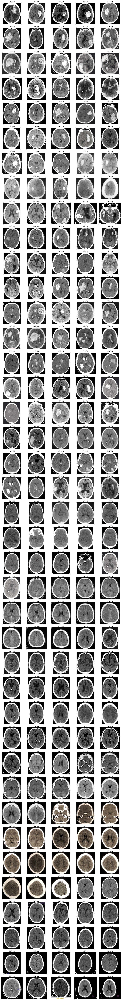

In [6]:
# Load images
folder_path = 'head_ct/'

# Get a list of all files in the folder
image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]

# Calculate the number of rows and columns for subplots
num_images = len(image_files)
num_rows = int(num_images / 5)  # Display 5 images per row
num_cols = 5

# Create list of arrays
images = []

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 3*num_rows))

# Loop through each image file and display it in a subplot
for i, image_file in enumerate(image_files):
    # Calculate the row and column index for the subplot
    row_idx = i // num_cols
    col_idx = i % num_cols
    
    # Construct the full path to the image
    image_path = os.path.join(folder_path, image_file)
    
    # Read the image using OpenCV
    image = cv2.imread(image_path)
    
    images.append(image)
    
    # Display the image in the subplot
    axes[row_idx, col_idx].imshow(image)
    axes[row_idx, col_idx].set_title(image_file)
    axes[row_idx, col_idx].axis('off')

# Adjust layout to prevent overlap of subplots
plt.tight_layout()
plt.show()

Let's load the labels from the csv file.

In [7]:
# Load labels
labels = pd.read_csv("labels.csv",  delimiter=';')
labels = labels.set_index('id')
display(labels)

,hemorrhage
id,
0,1
1,1
2,1
3,1
4,1
...,...
195,0
196,0
197,0


## Splitting the data into train, validation and test set

First we will divide our dataset into a training and a testing set. Then we will perform another dividision of the training set into a training and validation set, which will be used for varying the hyperparameters, and evaluating the model from one epoch to the other. Evaluation is done over the test set. For each split `stratify` is used to have balanced classes in the subsets.

In [8]:
# Split the data into training and testing sets
images_train, images_test, labels_train, labels_test = train_test_split(images, labels['hemorrhage'], test_size=0.2, random_state=20, stratify=labels['hemorrhage'])

# Split the data into training and validation sets
images_train, images_val, labels_train, labels_val = train_test_split(images_train, labels_train, test_size=0.2, random_state=20, stratify=labels_train)

# 3. Preprocessing

Images have different sizes and have been acquired on different scanners, so they have different intensity level ranges. Preprocessing is important for providing the model with images unified under the same characteristics for good accuracy and reliability.

At this stage we will:

- Normalize intensity levels
- Normalize sizes

In [9]:
# Obtain lists for training/validation/testing with normalized images
images_train_norm = preprocess_image(images_train)
images_test_norm = preprocess_image(images_test)
images_val_norm = preprocess_image(images_val)

# Convert label series into ararys
labels_train = np.array(labels_train)
labels_test = np.array(labels_test)
labels_val = np.array(labels_val)

# Convert list of images into array of arrays
images_train_norm = np.array(images_train_norm)
images_test_norm = np.array(images_test_norm)
images_val_norm = np.array(images_val_norm)

In [10]:
# Checkout resulting number of labels and images in each set
print(len(images_train_norm))
print(len(labels_train))
print(len(images_test_norm))
print(len(labels_test))
print(len(images_val_norm))
print(len(labels_val))

128
128
40
40
32
32


# 4. Data Augmentation

With data augmentation we can add more variability to our dataset while increasing the number of samples, by applying random transformations to our images (in shape, color, texture, intensity level, geometry, etc). For both these reasons data augmentation becomes a useful technique to prevent overfitting.

In [11]:
from keras.preprocessing import image as image_utils

# Create an image data generator for train set
gen = image_utils.ImageDataGenerator(rotation_range=20, 
                                     width_shift_range=0.1, 
                                     shear_range=0.1,
                                     zoom_range=0.1,
                                     height_shift_range=0.1, 
                                     # rescale=1./255, if input image is already scaled this will make augmented images black
                                     fill_mode='nearest')

# Create an image data generator for test set
test_gen = image_utils.ImageDataGenerator()

# Create an image data generator for validation set
val_gen = image_utils.ImageDataGenerator()

Let's plot some augmented images for visualization. We want to make sure that transformatics are not too drastic, causing images to no longer be identified by their labels.

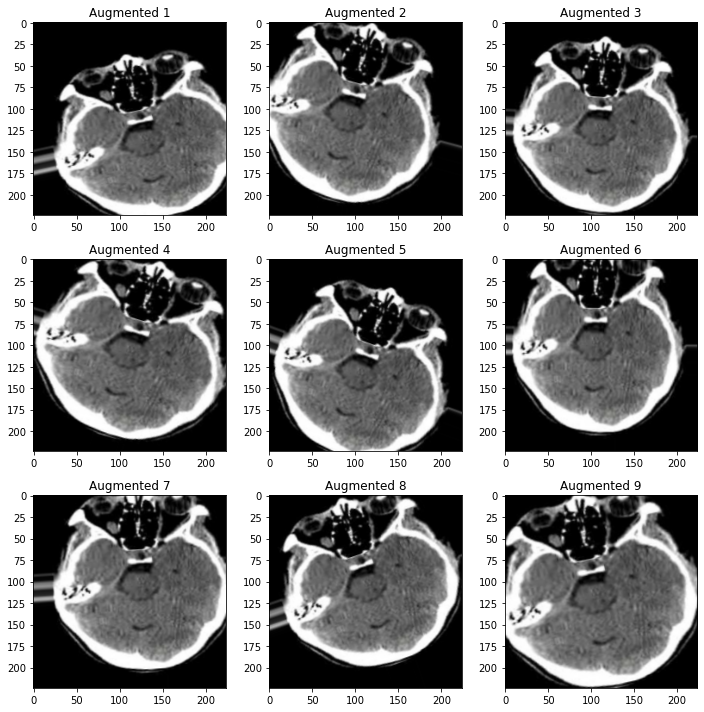

In [12]:
# Generate augmented images
augmented_images = []
for _ in range(9):  # Generate 9 augmented images for visualization
    augmented_img = gen.flow(tf.expand_dims(images_train_norm[1], 0)).next()
    augmented_images.append(augmented_img[0])

# Plot augmented images
plt.figure(figsize=(10, 10))

for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[i])
    plt.title(f'Augmented {i + 1}')
    
plt.tight_layout()
plt.show()

Now we introduce augmented images and their labels into batches of 'n'.

In [13]:
# Generated images will be stored in batches of n image, along with the original images.

# Create a data generator flow
train_generator = gen.flow(
    # Images
    x=images_train_norm,
    # Labels
    y=labels_train,
    # Group images into batches of 8
    batch_size=8,
    # Shuffle data during each epoch
    shuffle=True,
)

# Create a data generator flow
val_generator = val_gen.flow(
    # Images
    x=images_val_norm,
    # Labels
    y=labels_val,
    # Group images into batches of 8
    batch_size=8,
    # Shuffle data during each epoch
    shuffle=True,
)

# Create a data generator flow
test_generator = test_gen.flow(
    # Images
    x=images_test_norm,
    # Labels
    y=labels_test,
    # Group images into batches of 8
    batch_size=8,
    # Shuffle data during each epoch
    shuffle=True
)

# 5. Simple CNN Network

We can implement a simple CNN following the example seen in class for the MNIST dataset. This will help us understand the basic Deep-Learning workflow and identify relevant information about our dataset for future develpment of our own model.

Using `Sequential`, we create a convolutional neural network, then compile it, and train it.

**First without data augmentation** 

In [180]:
cnn_model = tf.keras.Sequential([

        tf.keras.layers.Conv2D(filters=24, kernel_size=(3,3), input_shape=(224, 224, 3), activation=tf.nn.relu,name='ConvLayer01'),       

        tf.keras.layers.MaxPool2D(pool_size=(2,2), strides=2, padding='valid'),
        tf.keras.layers.Dropout(0.2),

        tf.keras.layers.Conv2D(filters=24, kernel_size=(3,3)),
        tf.keras.layers.MaxPool2D(pool_size=(2,2), strides=2, padding='valid'),
        tf.keras.layers.Dropout(0.2),

        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation=tf.nn.relu),
    
        tf.keras.layers.Dense(10, activation='softmax')
    ])

cnn_model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 ConvLayer01 (Conv2D)        (None, 222, 222, 24)      672       
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 111, 111, 24)      0         
 g2D)                                                            
                                                                 
 dropout_5 (Dropout)         (None, 111, 111, 24)      0         
                                                                 
 conv2d_6 (Conv2D)           (None, 109, 109, 24)      5208      
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 54, 54, 24)        0         
 g2D)                                                            
                                                                 
 dropout_6 (Dropout)         (None, 54, 54, 24)       

Now we compile the model.

In [181]:
cnn_model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

Now we train the model with our data.

In [182]:
cnn_model.fit(images_train_norm, 
              labels_train, 
              epochs=10,
              batch_size=8,
              validation_data = (images_val_norm, labels_val))

Epoch 1/10
16/16 [==============================] - 4s 226ms/step - loss: 1.5321 - accuracy: 0.6328 - val_loss: 1.3663 - val_accuracy: 0.6250
Epoch 2/10
16/16 [==============================] - 3s 195ms/step - loss: 0.4755 - accuracy: 0.8203 - val_loss: 1.7118 - val_accuracy: 0.5000
Epoch 3/10
16/16 [==============================] - 3s 197ms/step - loss: 0.2678 - accuracy: 0.8828 - val_loss: 2.6093 - val_accuracy: 0.2188
Epoch 4/10
16/16 [==============================] - 3s 196ms/step - loss: 0.1854 - accuracy: 0.9297 - val_loss: 0.8436 - val_accuracy: 0.7188
Epoch 5/10
16/16 [==============================] - 3s 195ms/step - loss: 0.1503 - accuracy: 0.9453 - val_loss: 1.6483 - val_accuracy: 0.5000
Epoch 6/10
16/16 [==============================] - 3s 195ms/step - loss: 0.1101 - accuracy: 0.9688 - val_loss: 2.3228 - val_accuracy: 0.3438
Epoch 7/10
16/16 [==============================] - 3s 195ms/step - loss: 0.1019 - accuracy: 0.9688 - val_loss: 4.6621 - val_accuracy: 0.0000e+00
Ep

Now we evaluate the model on the test set.

In [183]:
cnn_model.evaluate(images_test_norm, labels_test)

2/2 [==============================] - 0s 30ms/step - loss: 2.6115 - accuracy: 0.3000


[2.6114819049835205, 0.30000001192092896]

Accuracy and loss results are suboptimal, we will try with data augmentation, which increases the dataset that the CNN will be trained on.

Additonally we can appreciate a lot of overfitting due to the high difference between the training and the testing dataset metrics (accuracy and loss). We can attribute these results mainly to the lack of sufficient data, meaning that the model might not have enough examples to generalize well, causing it to learn the training set too well but underperform for unseen sets.
To solve for this data augmentation is also a favourable approach.

**With data augmentation**

Now we will retrain the simple CNN model with the increased database (using Data Augmentation). This can be useful to augment the number of samples or to prevent the overfitting presented before, by applying random variations to the data.

This approach that we are following is often referred to as "transfer learning with data augmentation." It involves training a model initially on a dataset without augmentation to learn basic features and patterns (what it did previously) and then, the model is further trained on an augmented dataset to improve its generalization and robustness (what it will be done).

In [184]:
cnn_model.fit(train_generator, 
            epochs=10, 
            verbose=1,
            validation_data=val_generator)

Epoch 1/10
16/16 [==============================] - 4s 215ms/step - loss: 1.0713 - accuracy: 0.6484 - val_loss: 10.1262 - val_accuracy: 0.0000e+00
Epoch 2/10
16/16 [==============================] - 3s 198ms/step - loss: 0.8979 - accuracy: 0.6406 - val_loss: 1.4863 - val_accuracy: 0.5312
Epoch 3/10
16/16 [==============================] - 3s 202ms/step - loss: 0.6575 - accuracy: 0.6719 - val_loss: 1.8634 - val_accuracy: 0.5312
Epoch 4/10
16/16 [==============================] - 3s 200ms/step - loss: 0.5466 - accuracy: 0.7500 - val_loss: 0.4623 - val_accuracy: 0.7500
Epoch 5/10
16/16 [==============================] - 6s 329ms/step - loss: 0.4945 - accuracy: 0.7500 - val_loss: 0.3750 - val_accuracy: 0.8438
Epoch 6/10
16/16 [==============================] - 3s 198ms/step - loss: 0.4657 - accuracy: 0.7969 - val_loss: 0.4496 - val_accuracy: 0.7500
Epoch 7/10
16/16 [==============================] - 3s 204ms/step - loss: 0.6120 - accuracy: 0.6719 - val_loss: 0.6156 - val_accuracy: 0.7500
E

Now we evaluate the model on the test set

In [185]:
cnn_model.evaluate(test_generator, verbose=2)

5/5 - 0s - loss: 2.1260 - accuracy: 0.5000 - 179ms/epoch - 36ms/step


[2.1260385513305664, 0.5]

As it can be observed not only has the performance of the model improved in the testing set but there is also less overfitting, since now there is a smaller difference between training accuracy and validation accuracy, which means that our model adapts better to unseen data. However, the results obtained with this simple CNN seen in class, are very mediocre. Therefore, through the following sections we are going to try to improve them through Transfer Learning as well as by creating our own model.

It is worth noting that results will not always maintained for different kernel initializations. When the kernel of Jupyter-notebook is restarted performance metrics of the CNN model might vary. This can be attributed to the following reasons:
- **Random Initialization:** convolutional neural networks (CNNs), use random initialization for weights. The initial weights of the model are set randomly, and this randomness can lead to variations in training outcomes.
- **Stochastic Elements:** since the model includes randomness, such as dropout layers, the behavior of these elements can lead to variations in results across runs.
- **Memory State:** restarting the kernel may result in different memory states, potentially affecting the computations.

# 6. Transfer Learning

Existing CNNs with their trained weights can be reused and adapted to our classification task in the medical image environment. This is often a good idea, since in the medical image environment there is usually not enough images for a proper training of the network. Therefore, the CNN that has already learned feaure extraction from a large database of objects, such as ImageNet, can be useful for our task.

3 different pre-trained convolutional networks will be implemented and compared with our personalized network

## VGG16

<img src='https://www.researchgate.net/profile/Timea-Bezdan/publication/333242381/figure/fig2/AS:760979981860866@1558443174380/VGGNet-architecture-19.ppm' title='VGG16 architecture' style="width:700px;height:400px;"/>

**Model Description:**

The VGG16 architecture is a widely used Convolutional Neural Network (CNN) model for image classification. It was introduced by the Visual Graphics Group (VGG) at the University of Oxford. The architecture is characterized by its simplicity and uniformity, using small *3x3* convolutional filters throughout the network.

Here is an overview of the architecture:

- **Input Layer:** the input layer accepts RGB images with a fixed size of *224x224 pixels.*
- **Convolutional Blocks:** it is composed of five convolutional blocks, each followed by a **max-pooling layer**. Each convolutional block consists of two or three convolutional layers, followed by a ReLU activation function.
- **Fully Connected Layers:** after the convolutional blocks, there are three fully connected layers with *4096 neurons each*. Each fully connected layer is followed by a *ReLU activation function*.
- **Output Layer:** The output layer is a softmax layer with *1000 neurons*, corresponding to the 1000 ImageNet classes.

The convolutional layers use *3x3 filters* with a stride of 1 and "same" padding, meaning the spatial dimensions of the feature maps remain the same. Max-pooling layers with *2x2 filters* and a stride of 2 are used to reduce spatial dimensions.

The main difference in VGG16 compared to some other architectures is the consistent use of 3x3 filters and the stacking of convolutional layers. This uniformity makes the architecture easy to understand and implement but also leads to a large number of parameters (*14714688 parameters* just from convolutions) which increase computational resoures.

Compared to earlier CNN architectures, such as AlexNet, VGG16 became known for its simplicity and ease of understanding. However, its downside is the increased number of parameters, making it computationally expensive. Other architectures like ResNet and DenseNet address some of these issues.

In the context of transfer learning, using VGG16 involves taking the pre-trained weights from the model trained on ImageNet and adapting the model for a specific task by replacing the top layers of the network while keeping the convolutional base frozen or partially frozen. This approach leverages the learned hierarchical features from ImageNet and allows for efficient training on smaller datasets.

To perform transfer learning we first create the base model from the VGG16 model. This model is pre-trained on the ImageNet dataset, a large dataset consisting of 1.4 million images and 1000 classes. This knowledge base will assist us in classifying hemorrhage or no hermorrhage for our specific dataset.

We chose which layers of VGG16 will be used for feature extraction. The last classification layers ("top" layers) are not useful for our task. Instead, we will rely on the last layer before the flattening operation.

First, create an instance of a VGG16 model preloaded with weights trained on ImageNet. By specifying the argument include_top=False, it loads a network that does not include the classification layers, so that we can later add our own.

Next we will freeze the pre-trained convolutional base layers before compiling and training the model. Freezing prevents the weights in a particular layer from being updated during training, hence only the weights from our classification neural network will be trained.

Generally, a similar procedure will be performed for the different transfer learning cases convered in this notebook.

In [33]:
# Loading VGG16 model
base_model = VGG16(weights="imagenet", include_top=False, input_shape=(224, 224, 3)) # include_top=False removes the classification layer that was trained on the ImageNet dataset
base_model.trainable = False # Not trainable convolution weights 

base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

Next, we define the number of epochs for training with the base_model frozen and the number of epochs for training with the base model unfrozen base_model (see later in fine tuning)

In [34]:
fine_tune_epochs = 10
initial_epochs = 10

The personalized top layers, correspoding to classification layers, will be created to fit our task. Among the fully connected layers there can be found:
- **Flatten:** used to convert the multi-dimensional output of the preceding convolutional layer into a one-dimensional vector. Useful transitioning from convolutional layers (2D) to fully connected layers (1D).
- **Dropout:** regularization technique used to prevent overfitting in neural networks. During training, randomly selected neurons are deactivated, or "dropped out," with a specified probability. By doing this the model does not become dependent on specific neurons and helps the model generalize better to new, unseen data.
- **Batch Normalization:** normalizes the input of a layer by adjusting and scaling the activations. It helps in reducing internal covariate shift, making the model more stable and accelerating training.
- **Dense:** standard fully connected layers in a neural network. Each neuron in a dense layer is connected to every neuron in the previous layer. It is used for learning non-linear mappings between the input and output.

In [35]:
# Dropout layer with a 0.2 percentage to prevent overfitting. This layer deactivates 20% of neurons during training
dropout_layer_1 = layers.Dropout(0.2)

# Flatten layer to transform convoluted and pooled image with hundreds of feautures extracted into a 1D vector
flatten_layer = layers.Flatten()

# Batch Normalization layer that helps speed up training and stabilize the network.
batch_normalization_layer_1 = layers.BatchNormalization()

# Dense layer with 128 for fully connected network
dense_layer_1 = layers.Dense(256, activation='relu')

# Bacth Normalization
batch_normalization_layer_2 = layers.BatchNormalization()

# Dense Layer of 64 neurons
dense_layer_2 = layers.Dense(128, activation='relu')

# Batch Normalization 
batch_normalization_layer_3 = layers.BatchNormalization()

# Dense Layer of 64 neurons
dense_layer_3 = layers.Dense(64, activation='relu')

# Dropout Layer
dropout_layer_2 = layers.Dropout(0.2)

# Prediction Layer with final activation function (sigmoid since its a binary classification task)
prediction_layer = layers.Dense(1, activation='sigmoid')

With `tf.keras.Sequential` we create our on neural network with the defined layers above and print the details of the model created with `.summary()`

In [36]:
model_VGG16 = models.Sequential([
    base_model,
    dropout_layer_1,
    flatten_layer,
    batch_normalization_layer_1,
    dense_layer_1,
    batch_normalization_layer_2,
    dense_layer_2,
    batch_normalization_layer_3,
    dense_layer_3,
    dropout_layer_2,
    prediction_layer
])

# Print a summary of the model which shows the layers and parameters to train
model_VGG16.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 dropout_4 (Dropout)         (None, 7, 7, 512)         0         
                                                                 
 flatten_2 (Flatten)         (None, 25088)             0         
                                                                 
 batch_normalization_3 (Bat  (None, 25088)             100352    
 chNormalization)                                                
                                                                 
 dense_6 (Dense)             (None, 256)               6422784   
                                                                 
 batch_normalization_4 (Bat  (None, 256)               1024      
 chNormalization)                                     

Now we compile the model, defining a cost function, the metrics for performance evaluation and the optimization method.

In [37]:
# Create a list of metrics
metrics = [
    'accuracy',  
    custom_precision, 
    custom_recall, 
    custom_specificity, 
    custom_f1_score,
]

# Compile the model
model_VGG16.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=metrics
)

To prevent that the model from going through different epocs without any change in the evaluation metrics a **stopping criterion** is defined, such that the model stops if there are no changes after 3 epochs in the validation accuracy. After stopping the best weights are calledback.

In [38]:
es = EarlyStopping(monitor='val_accuracy', mode='max', patience=3,  restore_best_weights=True)

Ending with the definition of every metric and callback we can continue with the training of the model, following the approach (previously explained) of transfer learning with data augmentation. First, the model is trained with the original data.

In [39]:
# Retrain our model
history_VGG16 = model_VGG16.fit(images_train_norm, 
              labels_train, 
              epochs=initial_epochs,
              batch_size=8,
              validation_data = (images_val_norm, labels_val),
              callbacks=[es])

Epoch 1/10
16/16 [==============================] - 13s 752ms/step - loss: 0.5842 - accuracy: 0.7188 - custom_precision: 0.8000 - custom_recall: 0.6250 - custom_specificity: 0.8490 - custom_f1_score: 0.6716 - val_loss: 0.4586 - val_accuracy: 0.7188 - val_custom_precision: 0.6875 - val_custom_recall: 0.7000 - val_custom_specificity: 0.7167 - val_custom_f1_score: 0.6876
Epoch 2/10
16/16 [==============================] - 12s 758ms/step - loss: 0.2790 - accuracy: 0.8594 - custom_precision: 0.8490 - custom_recall: 0.8823 - custom_specificity: 0.8899 - custom_f1_score: 0.8351 - val_loss: 0.4519 - val_accuracy: 0.7500 - val_custom_precision: 0.7292 - val_custom_recall: 0.7000 - val_custom_specificity: 0.8000 - val_custom_f1_score: 0.7103
Epoch 3/10
16/16 [==============================] - 12s 736ms/step - loss: 0.1857 - accuracy: 0.9219 - custom_precision: 0.9531 - custom_recall: 0.9360 - custom_specificity: 0.9667 - custom_f1_score: 0.9305 - val_loss: 0.4341 - val_accuracy: 0.8125 - val_cus

Now we evaluate the model on the test set.

In [41]:
model_VGG16.evaluate(images_test_norm, labels_test)

2/2 [==============================] - 3s 532ms/step - loss: 0.2980 - accuracy: 0.9000 - custom_precision: 0.9167 - custom_recall: 0.9000 - custom_specificity: 0.9118 - custom_f1_score: 0.8990


[0.2980443239212036,
 0.8999999761581421,
 0.9166666269302368,
 0.8999999761581421,
 0.9117647409439087,
 0.8989899158477783]

Now we visualize the results from the metrics for training and validation in each epoch.

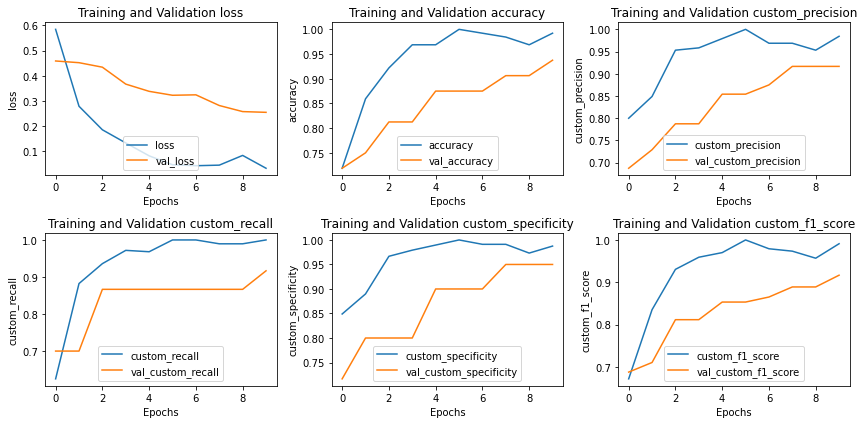

In [42]:
plot_metrics(history_VGG16)

### Fine-Tuning of convolutional weights

Previously we did not re-train the original CNN. Instead, we treated the CNN as an arbitrary feature extractor and only trained a fully connected neural network for classification purposes. This is because, in the beginning the convolutional layers have already learned discriminative parameters while our classification layers are brand new and totally random. If we allow  backpropagation from these random values all the way through the network, we risk destroying these powerful features. After several epochs the classification layers have 'warmed up' enough, such that we can further refine the weights of the model with fine tuning.

Fine-tuning is done by unfreezing the base model layers halfway through the training, compiling and then continuing the training, which allows the training of convolutional weights to adapt to our goal in medical imaging goal better. This second training phase is done with a very small learning rate, since we do not want to alter our convolutional filters drastically.

Also, as part of this approach, the model is retrained with the augmented dataset, in order to improve the generalization and robustness which is seen before in the sense of overfitting.

In [43]:
# Let's take a look to see how many layers are in the base model
print("Number of layers in the base model: ", len(base_model.layers))

# Allow the original CONV layers to be modified during the fine-tuning process (unfreeze base_model)
base_model.trainable = True

# Configure lower layers to so that they are not trainable 
fine_tune_at = 9
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

Number of layers in the base model:  19


In [45]:
base_learning_rate = 0.0001 # Continue training with a very small learning rate since we do not want to alter our CONV filters drastically.
opti = Adam(learning_rate=base_learning_rate/10)

model_VGG16.compile(
    optimizer=opti,
    loss='binary_crossentropy',
    metrics=metrics,
)

model_VGG16.summary()

total_epochs =  initial_epochs + fine_tune_epochs

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 dropout_4 (Dropout)         (None, 7, 7, 512)         0         
                                                                 
 flatten_2 (Flatten)         (None, 25088)             0         
                                                                 
 batch_normalization_3 (Bat  (None, 25088)             100352    
 chNormalization)                                                
                                                                 
 dense_6 (Dense)             (None, 256)               6422784   
                                                                 
 batch_normalization_4 (Bat  (None, 256)               1024      
 chNormalization)                                     

In [46]:
# Retrain our model
history_fine_VGG16 = model_VGG16.fit(train_generator, 
                    epochs=total_epochs,
                    initial_epoch=history_VGG16.epoch[-1],
                    steps_per_epoch=16,
                    validation_data=val_generator, 
                    validation_steps=4, 
                    callbacks=[es])

Epoch 10/20
16/16 [==============================] - 28s 2s/step - loss: 0.2606 - accuracy: 0.8906 - custom_precision: 0.8958 - custom_recall: 0.8958 - custom_specificity: 0.9302 - custom_f1_score: 0.8785 - val_loss: 0.1982 - val_accuracy: 0.9062 - val_custom_precision: 0.9167 - val_custom_recall: 0.8542 - val_custom_specificity: 0.9500 - val_custom_f1_score: 0.8810
Epoch 11/20
16/16 [==============================] - 25s 2s/step - loss: 0.1760 - accuracy: 0.9297 - custom_precision: 0.9333 - custom_recall: 0.9436 - custom_specificity: 0.9479 - custom_f1_score: 0.9291 - val_loss: 0.2106 - val_accuracy: 0.9375 - val_custom_precision: 0.9167 - val_custom_recall: 0.9167 - val_custom_specificity: 0.9500 - val_custom_f1_score: 0.9167
Epoch 12/20
16/16 [==============================] - 28s 2s/step - loss: 0.1444 - accuracy: 0.9453 - custom_precision: 0.9479 - custom_recall: 0.9510 - custom_specificity: 0.9646 - custom_f1_score: 0.9413 - val_loss: 0.4511 - val_accuracy: 0.8125 - val_custom_pr

In [47]:
model_VGG16.evaluate(test_generator)

5/5 [==============================] - 3s 525ms/step - loss: 0.2569 - accuracy: 0.9250 - custom_precision: 0.8333 - custom_recall: 1.0000 - custom_specificity: 0.8714 - custom_f1_score: 0.8933


[0.25689154863357544,
 0.925000011920929,
 0.8333333134651184,
 1.0,
 0.8714286088943481,
 0.8933333158493042]

Fine tuning has proven to be an advantageous for obtaining image classifiers on our own datasets from pre-trained CNNs, since the accuracy of the model has been improved.

Now we plot a comparison between predictions obatined for each image and true corresponding labels.

2/2 [==============================] - 5s 750ms/step


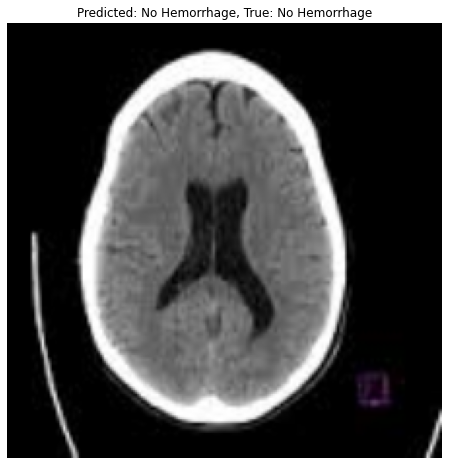

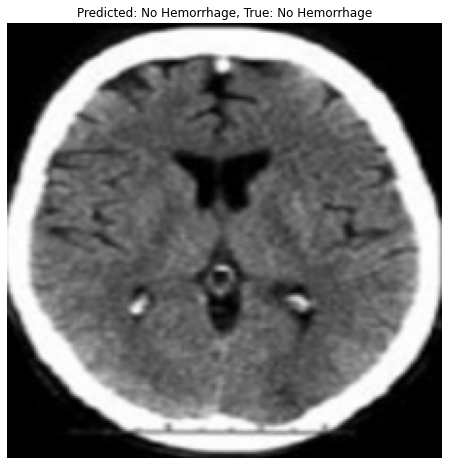

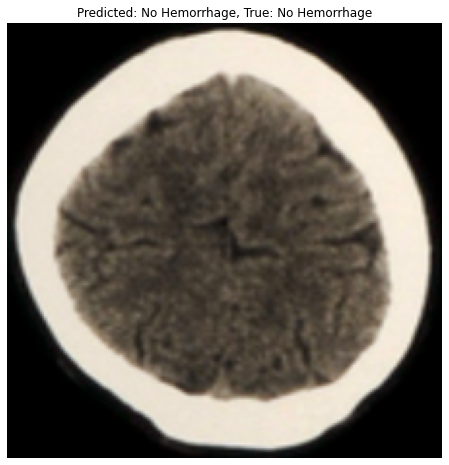

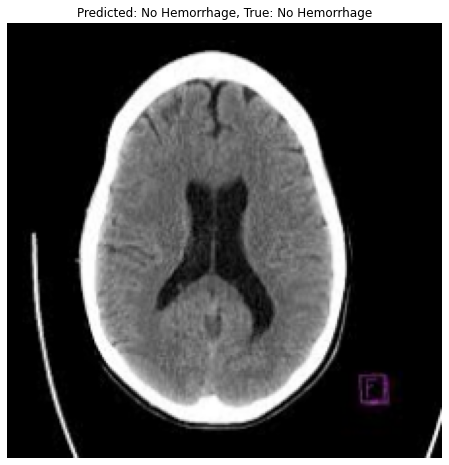

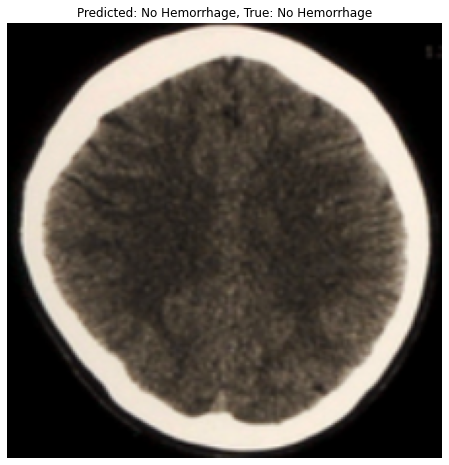

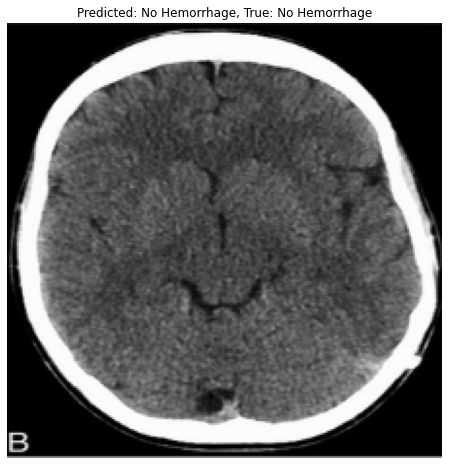

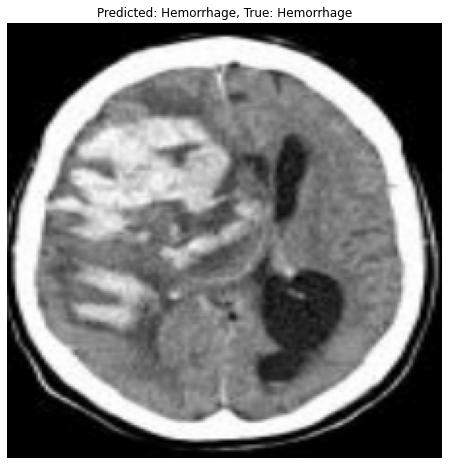

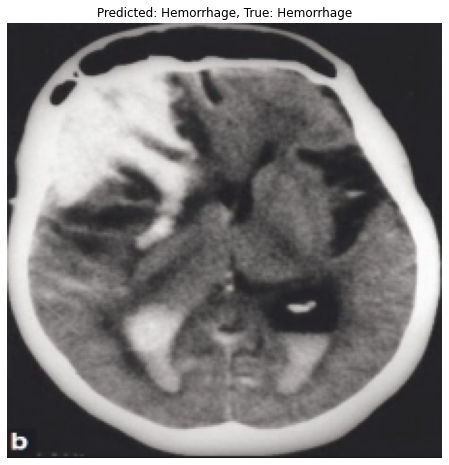

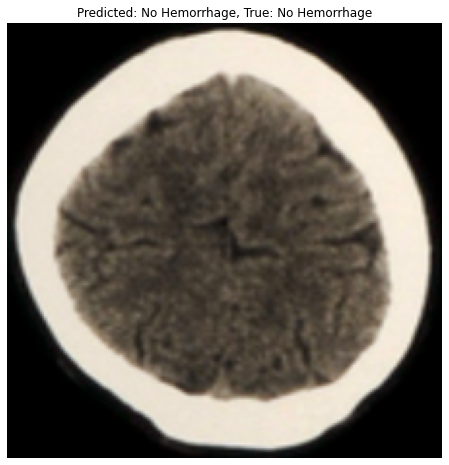

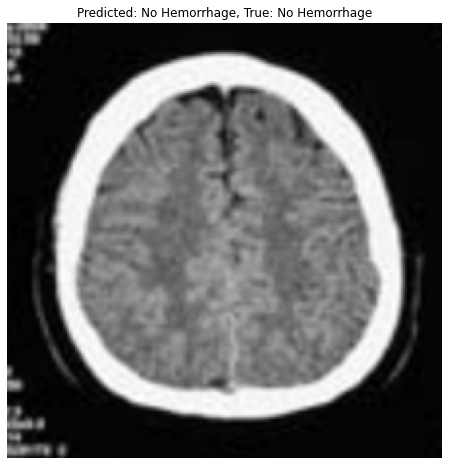

In [130]:
evaluate_predictions(model_VGG16, images_test_norm, labels_test, 10)

## DenseNet169

<img src='https://miro.medium.com/v2/resize:fit:1400/format:webp/1*vIZhPImFr9Gjpx6ZB7IOJg.png' title='DenseNet architecture' style="width:700px;height:500px;"/>

**Model Description:**

Densely Connected Convolutional Networks (DenseNets) represent a novel approach to deep convolutional networks by addressing the challenges that arise when networks become deeper and parameters increase drastically. Unlike traditional networks where information flow may diminish as the depth increases, DenseNets maintain a dense connectivity pattern between layers, ensuring maximum information and gradient flow. This is achieved by connecting each layer directly to every other layer in a feed-forward manner. DenseNet169, like other CNNs trained with ImageNet, has undergone pre-training on a large dataset containing 1.4 million images across 1000 classes

Contrary to intuition, DenseNets require fewer parameters than equivalent traditional convolutional neural networks (CNNs). They achieve this by connecting each layer directly, eliminating the need to learn redundant feature maps. The approach of connecting each layer to all subsequent layers ensures efficient gradient flow, overcoming challenges faced by very deep networks.

DenseNet169 is a variant of the DenseNet architecture, specifically DenseNet-BC with a growth rate of 32. The "BC" indicates the use of bottleneck layers and compression, making it more computationally efficient.

Here is an overview of the architecture:

- **Dense Block Structure:**
     - <u>Dense Blocks:</u> The network consists of multiple dense blocks, where each layer is directly connected to every other layer within the block
     - <u>ense Layers:</u> Within each dense block, dense layers concatenate feature maps instead of summing them. This dense connectivity ensures efficient information and gradient flow.
     - <u>Growth Rate (k):</u> The growth rate controls how many feature maps are added at each layer. In DenseNet169, the growth rate is 32, meaning each layer adds 32 feature maps.
     
- **Transition Blocks:**
    - <u>Transition Blocks:</u> These blocks 
    handle downsampling and include *batch normalization*, a *1x1 convolution*, and a *2x2 pooling layer*.
    - <u>Compression Factor (Theta):</u> DenseNet169 introduces a compression factor (theta) to reduce the number of output feature maps, improving computational efficiency.
   
- **Bottleneck Layers (BC)**: DenseNet169 uses bottleneck layers (1x1 convolution before the 3x3 convolution) to reduce feature map size before the 3x3 convolution. This approach enhances computational efficiency.

DenseNet architecture differs from traditional CNNs, such as VGG or ResNet, by directly connecting each layer to every other layer (concatenating feature maps instead of summing them), promoting efficient feature reuse. The use of dense connectivity reduces the number of parameters, making DenseNets computationally efficient despite their depth.

Create an instance of a DenseNet169 model preloaded with weights trained on ImageNet.

In [59]:
# Loading DenseNet169  model
base_model = DenseNet169(input_shape=(224,224,3), include_top=False, weights="imagenet") 
# include_top=False removes the classification layer that was trained on the ImageNet dataset

base_model.trainable = False # Not trainable convolution weights 

base_model.summary()

Model: "densenet169"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 230, 230, 3)          0         ['input_3[0][0]']             
 g2D)                                                                                             
                                                                                                  
 conv1/conv (Conv2D)         (None, 112, 112, 64)         9408      ['zero_padding2d[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1/conv[0][0]']

 conv2_block4_0_bn (BatchNo  (None, 56, 56, 160)          640       ['conv2_block3_concat[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv2_block4_0_relu (Activ  (None, 56, 56, 160)          0         ['conv2_block4_0_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv2_block4_1_conv (Conv2  (None, 56, 56, 128)          20480     ['conv2_block4_0_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv2_block4_1_bn (BatchNo  (None, 56, 56, 128)          512       ['conv2_block4_1_conv[0][0]'] 
 rmalizati

 rmalization)                                                                                     
                                                                                                  
 conv3_block1_1_relu (Activ  (None, 28, 28, 128)          0         ['conv3_block1_1_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv3_block1_2_conv (Conv2  (None, 28, 28, 32)           36864     ['conv3_block1_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv3_block1_concat (Conca  (None, 28, 28, 160)          0         ['pool2_pool[0][0]',          
 tenate)                                                             'conv3_block1_2_conv[0][0]'] 
          

 conv3_block5_1_bn (BatchNo  (None, 28, 28, 128)          512       ['conv3_block5_1_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv3_block5_1_relu (Activ  (None, 28, 28, 128)          0         ['conv3_block5_1_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv3_block5_2_conv (Conv2  (None, 28, 28, 32)           36864     ['conv3_block5_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv3_block5_concat (Conca  (None, 28, 28, 288)          0         ['conv3_block4_concat[0][0]', 
 tenate)  

                                                                                                  
 conv3_block9_1_bn (BatchNo  (None, 28, 28, 128)          512       ['conv3_block9_1_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv3_block9_1_relu (Activ  (None, 28, 28, 128)          0         ['conv3_block9_1_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv3_block9_2_conv (Conv2  (None, 28, 28, 32)           36864     ['conv3_block9_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv3_blo

 pool3_pool (AveragePooling  (None, 14, 14, 256)          0         ['pool3_conv[0][0]']          
 2D)                                                                                              
                                                                                                  
 conv4_block1_0_bn (BatchNo  (None, 14, 14, 256)          1024      ['pool3_pool[0][0]']          
 rmalization)                                                                                     
                                                                                                  
 conv4_block1_0_relu (Activ  (None, 14, 14, 256)          0         ['conv4_block1_0_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv4_block1_1_conv (Conv2  (None, 14, 14, 128)          32768     ['conv4_block1_0_relu[0][0]'] 
 D)       

                                                                                                  
 conv4_block4_concat (Conca  (None, 14, 14, 384)          0         ['conv4_block3_concat[0][0]', 
 tenate)                                                             'conv4_block4_2_conv[0][0]'] 
                                                                                                  
 conv4_block5_0_bn (BatchNo  (None, 14, 14, 384)          1536      ['conv4_block4_concat[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_block5_0_relu (Activ  (None, 14, 14, 384)          0         ['conv4_block5_0_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv4_blo

 D)                                                                                               
                                                                                                  
 conv4_block8_concat (Conca  (None, 14, 14, 512)          0         ['conv4_block7_concat[0][0]', 
 tenate)                                                             'conv4_block8_2_conv[0][0]'] 
                                                                                                  
 conv4_block9_0_bn (BatchNo  (None, 14, 14, 512)          2048      ['conv4_block8_concat[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_block9_0_relu (Activ  (None, 14, 14, 512)          0         ['conv4_block9_0_bn[0][0]']   
 ation)                                                                                           
          

 conv4_block12_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block12_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block12_concat (Conc  (None, 14, 14, 640)          0         ['conv4_block11_concat[0][0]',
 atenate)                                                            'conv4_block12_2_conv[0][0]']
                                                                                                  
 conv4_block13_0_bn (BatchN  (None, 14, 14, 640)          2560      ['conv4_block12_concat[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_block13_0_relu (Acti  (None, 14, 14, 640)          0         ['conv4_block13_0_bn[0][0]']  
 vation)  

                                                                                                  
 conv4_block16_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block16_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block16_concat (Conc  (None, 14, 14, 768)          0         ['conv4_block15_concat[0][0]',
 atenate)                                                            'conv4_block16_2_conv[0][0]']
                                                                                                  
 conv4_block17_0_bn (BatchN  (None, 14, 14, 768)          3072      ['conv4_block16_concat[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_blo

 vation)                                                                                          
                                                                                                  
 conv4_block20_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block20_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block20_concat (Conc  (None, 14, 14, 896)          0         ['conv4_block19_concat[0][0]',
 atenate)                                                            'conv4_block20_2_conv[0][0]']
                                                                                                  
 conv4_block21_0_bn (BatchN  (None, 14, 14, 896)          3584      ['conv4_block20_concat[0][0]']
 ormalization)                                                                                    
          

 conv4_block24_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block24_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block24_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block24_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block24_concat (Conc  (None, 14, 14, 1024)         0         ['conv4_block23_concat[0][0]',
 atenate)                                                            'conv4_block24_2_conv[0][0]']
                                                                                                  
 conv4_block25_0_bn (BatchN  (None, 14, 14, 1024)         4096      ['conv4_block24_concat[0][0]']
 ormalizat

                                                                                                  
 conv4_block28_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block28_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block28_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block28_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block28_concat (Conc  (None, 14, 14, 1152)         0         ['conv4_block27_concat[0][0]',
 atenate)                                                            'conv4_block28_2_conv[0][0]']
                                                                                                  
 conv4_blo

 ormalization)                                                                                    
                                                                                                  
 conv4_block32_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block32_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block32_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block32_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block32_concat (Conc  (None, 14, 14, 1280)         0         ['conv4_block31_concat[0][0]',
 atenate)                                                            'conv4_block32_2_conv[0][0]']
          

                                                                                                  
 conv5_block4_0_bn (BatchNo  (None, 7, 7, 736)            2944      ['conv5_block3_concat[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv5_block4_0_relu (Activ  (None, 7, 7, 736)            0         ['conv5_block4_0_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv5_block4_1_conv (Conv2  (None, 7, 7, 128)            94208     ['conv5_block4_0_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv5_blo

 tenate)                                                             'conv5_block7_2_conv[0][0]'] 
                                                                                                  
 conv5_block8_0_bn (BatchNo  (None, 7, 7, 864)            3456      ['conv5_block7_concat[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv5_block8_0_relu (Activ  (None, 7, 7, 864)            0         ['conv5_block8_0_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv5_block8_1_conv (Conv2  (None, 7, 7, 128)            110592    ['conv5_block8_0_relu[0][0]'] 
 D)                                                                                               
          

 conv5_block11_concat (Conc  (None, 7, 7, 992)            0         ['conv5_block10_concat[0][0]',
 atenate)                                                            'conv5_block11_2_conv[0][0]']
                                                                                                  
 conv5_block12_0_bn (BatchN  (None, 7, 7, 992)            3968      ['conv5_block11_concat[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv5_block12_0_relu (Acti  (None, 7, 7, 992)            0         ['conv5_block12_0_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv5_block12_1_conv (Conv  (None, 7, 7, 128)            126976    ['conv5_block12_0_relu[0][0]']
 2D)      

                                                                                                  
 conv5_block15_concat (Conc  (None, 7, 7, 1120)           0         ['conv5_block14_concat[0][0]',
 atenate)                                                            'conv5_block15_2_conv[0][0]']
                                                                                                  
 conv5_block16_0_bn (BatchN  (None, 7, 7, 1120)           4480      ['conv5_block15_concat[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv5_block16_0_relu (Acti  (None, 7, 7, 1120)           0         ['conv5_block16_0_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv5_blo

 2D)                                                                                              
                                                                                                  
 conv5_block19_concat (Conc  (None, 7, 7, 1248)           0         ['conv5_block18_concat[0][0]',
 atenate)                                                            'conv5_block19_2_conv[0][0]']
                                                                                                  
 conv5_block20_0_bn (BatchN  (None, 7, 7, 1248)           4992      ['conv5_block19_concat[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv5_block20_0_relu (Acti  (None, 7, 7, 1248)           0         ['conv5_block20_0_bn[0][0]']  
 vation)                                                                                          
          

 conv5_block23_2_conv (Conv  (None, 7, 7, 32)             36864     ['conv5_block23_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv5_block23_concat (Conc  (None, 7, 7, 1376)           0         ['conv5_block22_concat[0][0]',
 atenate)                                                            'conv5_block23_2_conv[0][0]']
                                                                                                  
 conv5_block24_0_bn (BatchN  (None, 7, 7, 1376)           5504      ['conv5_block23_concat[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv5_block24_0_relu (Acti  (None, 7, 7, 1376)           0         ['conv5_block24_0_bn[0][0]']  
 vation)  

                                                                                                  
 conv5_block27_2_conv (Conv  (None, 7, 7, 32)             36864     ['conv5_block27_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv5_block27_concat (Conc  (None, 7, 7, 1504)           0         ['conv5_block26_concat[0][0]',
 atenate)                                                            'conv5_block27_2_conv[0][0]']
                                                                                                  
 conv5_block28_0_bn (BatchN  (None, 7, 7, 1504)           6016      ['conv5_block27_concat[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv5_blo

 vation)                                                                                          
                                                                                                  
 conv5_block31_2_conv (Conv  (None, 7, 7, 32)             36864     ['conv5_block31_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv5_block31_concat (Conc  (None, 7, 7, 1632)           0         ['conv5_block30_concat[0][0]',
 atenate)                                                            'conv5_block31_2_conv[0][0]']
                                                                                                  
 conv5_block32_0_bn (BatchN  (None, 7, 7, 1632)           6528      ['conv5_block31_concat[0][0]']
 ormalization)                                                                                    
          

Next, we define the number of epochs for training with the base_model frozen and the number of epochs for training with the base model unfrozen base_model.

In [60]:
# Define epochs for training with frozen base_model and training epochs with unfrozen base_model (fine tuning)
fine_tune_epochs = 10
initial_epochs = 8

Now the personalized top layers, correspoding to classification layers, will be created to fit our task. Similarly to the VGG16 model, the following layers can be found among the fully connected network: **Flatten layer** after convolution process to obtain a vector with final features, **Dropout layers** to reduce dependencies to certain neurons, **Batch Normalization layers** to normalize the output from one layer to the other, **Dense layers** to fully connect layers in the neural network.

In [61]:
# Dropout layer with a rate of 0.5, used to prevent overfitting by randomly deactivating 50% of neurons during training.
dropout_layer_1 = layers.Dropout(0.5)

# Flattening to transform the output from previous layers into a 1D vector.
flatten_layer = layers.Flatten()

# Batch Normalization layer to accelerate training and stabilize the network.
batch_normalization_layer_1 = layers.BatchNormalization()

# Dense layer with 2048 units, ReLU activation, and He uniform kernel initialization.
dense_layer_1 = layers.Dense(2048, activation='relu', kernel_initializer='he_uniform')

# Batch Normalization layer.
batch_normalization_layer_2 = layers.BatchNormalization()

# Dropout layer.
dropout_layer_2 = layers.Dropout(0.5)

# Dense layer with 1024 units, ReLU activation, and He uniform kernel initialization.
dense_layer_2 = layers.Dense(1024, activation='relu', kernel_initializer='he_uniform')

# Batch Normalization layer.
batch_normalization_layer_3 = layers.BatchNormalization()

# Dropout layer.
dropout_layer_3 = layers.Dropout(0.5)

# Final activation function.
prediction_layer= layers.Dense(1, activation='sigmoid')


With `tf.keras.Sequential` we create our on neural network with the defined layers above and print the details of the model created with `.summary()`

In [62]:
model_densenet169 = models.Sequential([
    base_model,
    dropout_layer_1,
    flatten_layer,
    batch_normalization_layer_1,
    dense_layer_1,
    batch_normalization_layer_2,
    dropout_layer_2,
    dense_layer_2,
    batch_normalization_layer_3,
    dropout_layer_3,
    prediction_layer
])

# Print a summary of the model which shows the layers and parameters to train
model_densenet169.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet169 (Functional)    (None, 7, 7, 1664)        12642880  
                                                                 
 dropout_6 (Dropout)         (None, 7, 7, 1664)        0         
                                                                 
 flatten_3 (Flatten)         (None, 81536)             0         
                                                                 
 batch_normalization_6 (Bat  (None, 81536)             326144    
 chNormalization)                                                
                                                                 
 dense_10 (Dense)            (None, 2048)              166987776 
                                                                 
 batch_normalization_7 (Bat  (None, 2048)              8192      
 chNormalization)                                     

Now we compile the model, defining a cost function, the metrics for performance evaluation and the optimization method.

In [63]:
# Create a list of metrics
metrics = [
    'accuracy',  
    custom_precision, 
    custom_recall, 
    custom_specificity, 
    custom_f1_score,
]

# Compile the model
model_densenet169.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=metrics
)

Create an EarlyStopping callback that is configured to monitor the validation accuracy, stop training if there is no improvement for three consecutive epochs, and restore the model weights to the best-performing configuration.

In [64]:
es = EarlyStopping(monitor='val_accuracy', mode='max', patience=3,  restore_best_weights=True)

Ending with the definition of every metric and callback we can continue with the training of the model, following the approach (previously explained) of transfer learning with data augmentation. First, the model is trained with the original data.

In [65]:
# Train our model
history_densenet169 = model_densenet169.fit(images_train_norm, 
              labels_train, 
              epochs=initial_epochs,
              batch_size=8,
              validation_data = (images_val_norm, labels_val),
              callbacks=[es])

Epoch 1/8
16/16 [==============================] - 48s 2s/step - loss: 0.7590 - accuracy: 0.6953 - custom_precision: 0.6938 - custom_recall: 0.7646 - custom_specificity: 0.6781 - custom_f1_score: 0.6966 - val_loss: 4.1432 - val_accuracy: 0.7500 - val_custom_precision: 1.0000 - val_custom_recall: 0.5000 - val_custom_specificity: 1.0000 - val_custom_f1_score: 0.6554
Epoch 2/8
16/16 [==============================] - 31s 2s/step - loss: 0.5214 - accuracy: 0.8438 - custom_precision: 0.8188 - custom_recall: 0.8917 - custom_specificity: 0.8649 - custom_f1_score: 0.8193 - val_loss: 2.5253 - val_accuracy: 0.8125 - val_custom_precision: 1.0000 - val_custom_recall: 0.6333 - val_custom_specificity: 1.0000 - val_custom_f1_score: 0.7651
Epoch 3/8
16/16 [==============================] - 30s 2s/step - loss: 0.3828 - accuracy: 0.9062 - custom_precision: 0.9125 - custom_recall: 0.9310 - custom_specificity: 0.9357 - custom_f1_score: 0.8977 - val_loss: 0.8898 - val_accuracy: 0.9062 - val_custom_precisio

Now we evaluate the model on the test set.

In [66]:
model_densenet169.evaluate(images_test_norm, labels_test)

2/2 [==============================] - 5s 555ms/step - loss: 1.2094 - accuracy: 0.8500 - custom_precision: 0.8824 - custom_recall: 0.9333 - custom_specificity: 0.8824 - custom_f1_score: 0.9062


[1.2093913555145264,
 0.8500000238418579,
 0.8823529481887817,
 0.9333333373069763,
 0.8823529481887817,
 0.90625]

Now we visualize the results from the metrics for training and validation in each epoch

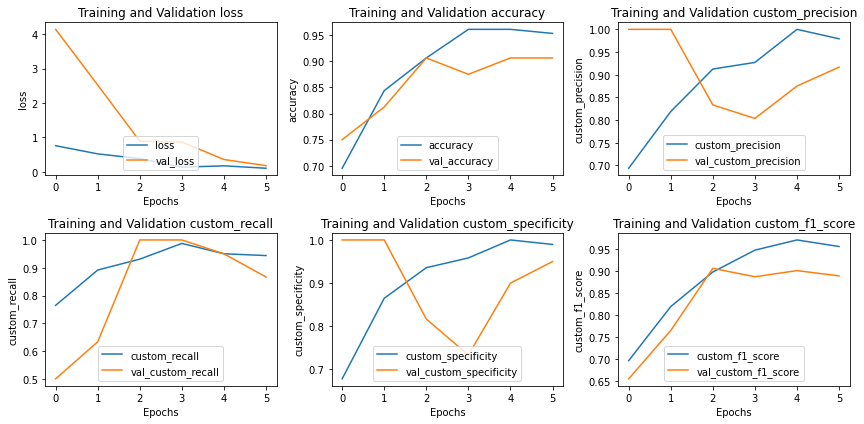

In [67]:
plot_metrics(history_densenet169)

### Fine-Tuning of convolutional weights

The same process as for VGG16 is followed, just changing the lower layers that are not trained, due to the difference between both models, VGG16 and DenseNet169, having 19 and 595 layers respectively.

In [68]:
# Let's take a look to see how many layers are in the base model
print("Number of layers in the base model: ", len(base_model.layers))

# Allow the original CONV layers to be modified during the fine-tuning process (unfreeze base_model)
base_model.trainable = True

# Configure lower layers to so that they are not trainable 
fine_tune_at = 500
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

Number of layers in the base model:  595


In [69]:
base_learning_rate = 0.0001 # Continue training with a very small learning rate since we do not want to alter our CONV filters drastically.
opti = Adam(learning_rate=base_learning_rate/10)

model_densenet169.compile(
    optimizer=opti,
    loss='binary_crossentropy',
    metrics=metrics,
)

model_densenet169.summary()

total_epochs =  initial_epochs + fine_tune_epochs

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet169 (Functional)    (None, 7, 7, 1664)        12642880  
                                                                 
 dropout_6 (Dropout)         (None, 7, 7, 1664)        0         
                                                                 
 flatten_3 (Flatten)         (None, 81536)             0         
                                                                 
 batch_normalization_6 (Bat  (None, 81536)             326144    
 chNormalization)                                                
                                                                 
 dense_10 (Dense)            (None, 2048)              166987776 
                                                                 
 batch_normalization_7 (Bat  (None, 2048)              8192      
 chNormalization)                                     

Now, the model is retrained with the augmented dataset, in order to improve the generalization and robustness which is seen before in the sense of overfitting.

In [70]:
# Retrain our model
history_fine_densenet169 = model_densenet169.fit(train_generator, 
                    epochs=total_epochs,
                    initial_epoch=history_densenet169.epoch[-1],
                    steps_per_epoch=16,
                    validation_data=val_generator, 
                    validation_steps=4, 
                    callbacks=[es])

Epoch 6/18
16/16 [==============================] - 51s 2s/step - loss: 3.5310 - accuracy: 0.6875 - custom_precision: 0.7281 - custom_recall: 0.6417 - custom_specificity: 0.7568 - custom_f1_score: 0.6702 - val_loss: 0.4865 - val_accuracy: 0.8438 - val_custom_precision: 0.7708 - val_custom_recall: 0.8333 - val_custom_specificity: 0.8167 - val_custom_f1_score: 0.7916
Epoch 7/18
16/16 [==============================] - 33s 2s/step - loss: 1.1985 - accuracy: 0.8281 - custom_precision: 0.8375 - custom_recall: 0.8406 - custom_specificity: 0.8635 - custom_f1_score: 0.8198 - val_loss: 0.3791 - val_accuracy: 0.8438 - val_custom_precision: 0.8375 - val_custom_recall: 0.8875 - val_custom_specificity: 0.8250 - val_custom_f1_score: 0.8532
Epoch 8/18
16/16 [==============================] - 31s 2s/step - loss: 0.9438 - accuracy: 0.8281 - custom_precision: 0.8271 - custom_recall: 0.8365 - custom_specificity: 0.8417 - custom_f1_score: 0.8184 - val_loss: 0.3226 - val_accuracy: 0.9062 - val_custom_preci

In [71]:
model_densenet169.evaluate(test_generator)

5/5 [==============================] - 3s 572ms/step - loss: 0.6612 - accuracy: 0.8750 - custom_precision: 0.9214 - custom_recall: 0.8500 - custom_specificity: 0.8500 - custom_f1_score: 0.8775


[0.6611974239349365,
 0.875,
 0.9214285612106323,
 0.8500000238418579,
 0.8500000238418579,
 0.8774725198745728]

Fine tuning has proven to be an advantageous for obtaining image classifiers on our own datasets from pre-trained CNNs, since the accuracy of the model has been improved after allowing some convolution parameters to adjust better to our dataset.

Now we plot a comparison between predictions obatined for each image and true corresponding labels.

2/2 [==============================] - 5s 886ms/step


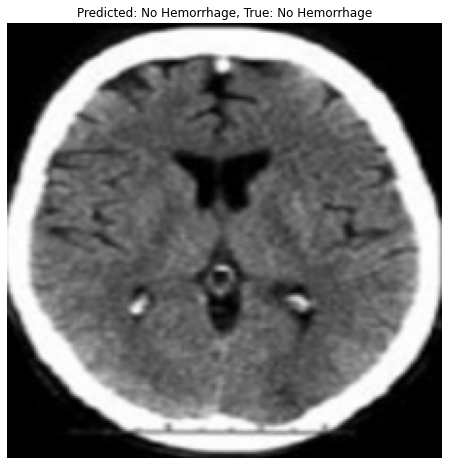

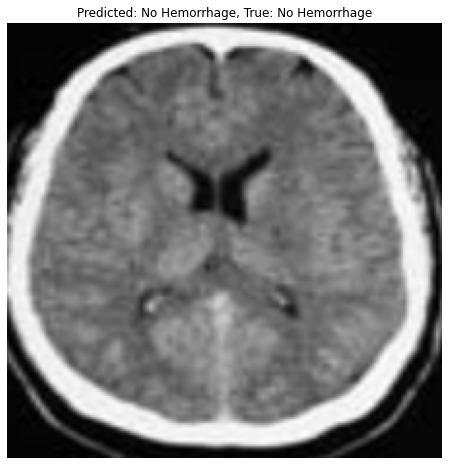

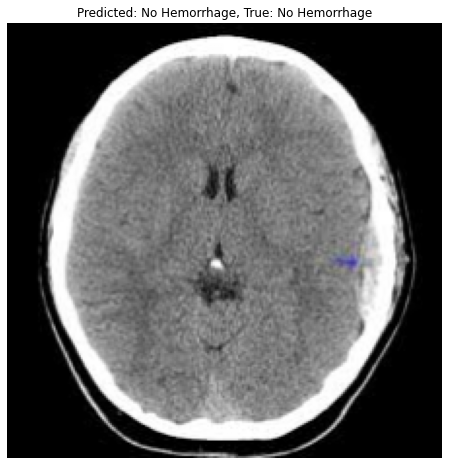

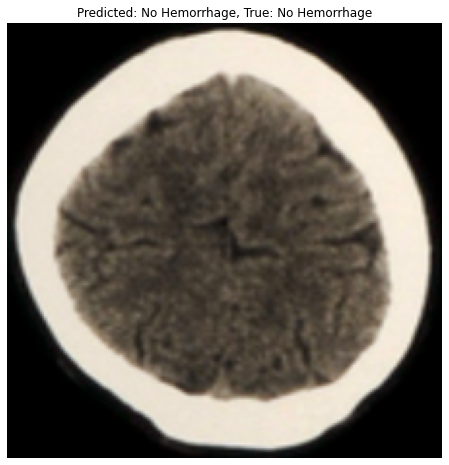

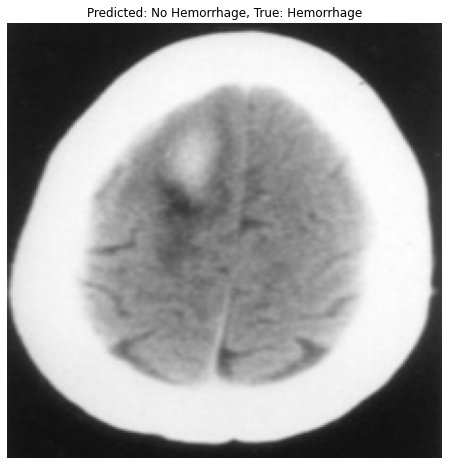

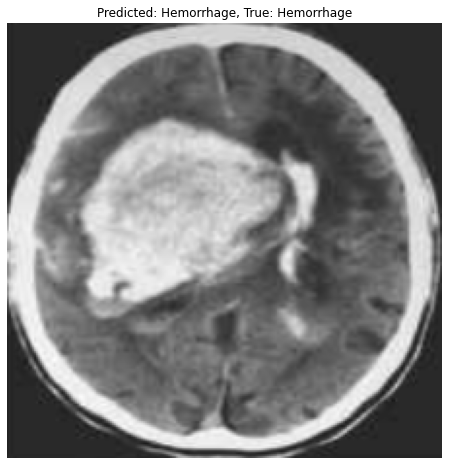

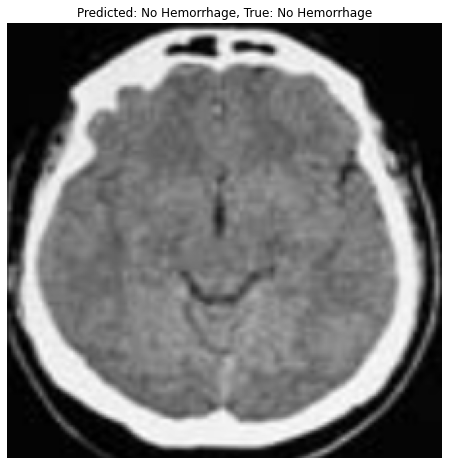

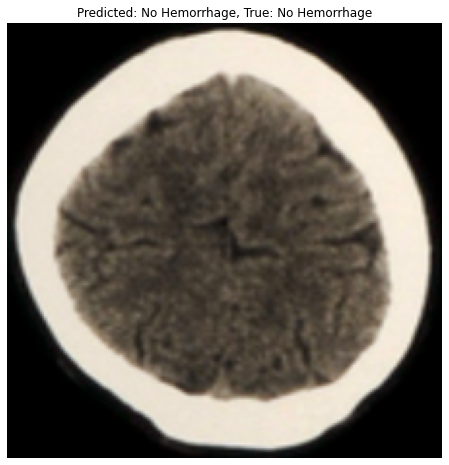

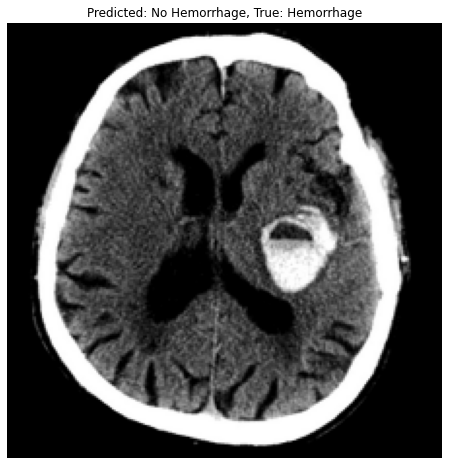

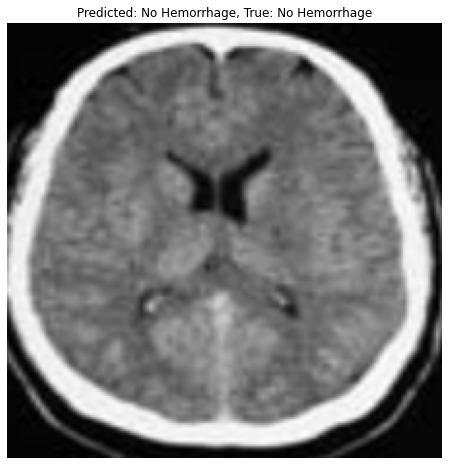

In [131]:
evaluate_predictions(model_densenet169, images_test_norm, labels_test, 10)

## ResNet50

<img src='https://miro.medium.com/v2/resize:fit:828/format:webp/0*tH9evuOFqk8F41FG.png' title='ResNet50 architecture' style="width:700px;height:350px;"/>

**Model Description:**

ResNet (Residual Network), is a type of CNN architecture that was introduced to address the problem of vanishing gradients in deep networks. The vanishing gradient problem occurs when the gradient of the loss function becomes very small as it is backpropagated to earlier layers during training. This can make it challenging for the network to learn and update the weights of the earlier layers, potentially limiting the depth of the network.

ResNet50 is a specific variant of the ResNet architecture, and the "50" indicates the depth of the network in terms of layers. ResNet50 consists of 50 layers, including convolutional layers, pooling layers, fully connected layers, and skip connections. The skip connections are the key innovation of ResNet, and they help in overcoming the vanishing gradient problem by providing a shortcut for the gradient to flow more easily through the network. Instead of passing through each layer one by one, the gradient can "skip" one or more layers and be directly propagated to subsequent layers. This helps in the training of very deep networks by allowing the model to learn both high-level and low-level features effectively. They are implemented by adding the input of a layer to the output of one or more layers ahead. 

Here is an overview of the architecture:

- **Input layer:**
     The input to ResNet50 can be a RGB image with fixed dimensions 224x224 pixels.
     
- **Initial Convolutional Layer:**
    The first layer is a traditional convolutional layer with 7x7 filters, followed by a max-pooling layer to reduce spatial dimensions.
   
- **Residual Blocks**: 
    - Each block consists of multiple convolutional layers.
    - The basic building block of ResNet50 is the bottleneck block, which includes three convolutional layers: 1x1, 3x3, and another 1x1.
    - Batch normalization is applied after each convolutional layer.
    - The skip connections allows the input to skip one or more layers and be added directly to the output of the block.
    - The use of bottleneck blocks helps in reducing the computational cost while maintaining the network's representational power.
    
- **Stacked Blocks**:
    - ResNet50 has multiple stacked residual blocks. The number of blocks and their configurations may vary within the network.
    - The stacking of these blocks enables the learning of increasingly abstract features.
    
- **Global Average Pooling (GAP)**:
    - Instead of using traditional fully connected layers at the end, ResNet50 employs global average pooling.
    - GAP reduces the spatial dimensions to 1x1, resulting in a fixed-size representation for any input, regardless of its spatial dimensions.
    - This helps in reducing the number of parameters in the network and mitigates overfitting.
    
- **Output Layer**:
    - The final layer is a fully connected layer with softmax activation for classification tasks.
    - The number of nodes in this layer corresponds to the number of classes in the classification problem.

Create an instance of a ResNet50 model preloaded with weights trained on ImageNet.

In [72]:
# Loading ResNet50 model
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
# include_top=False removes the classification layer that was trained on the ImageNet dataset

base_model.trainable = False # Not trainable convolution weights 

base_model.summary() # Summary of all the layers in this model, as well as the trainable and non-trainable parameters.

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_4[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                       

                                                                                                  
 conv2_block3_1_conv (Conv2  (None, 56, 56, 64)           16448     ['conv2_block2_out[0][0]']    
 D)                                                                                               
                                                                                                  
 conv2_block3_1_bn (BatchNo  (None, 56, 56, 64)           256       ['conv2_block3_1_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv2_block3_1_relu (Activ  (None, 56, 56, 64)           0         ['conv2_block3_1_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv2_blo

 ation)                                                                                           
                                                                                                  
 conv3_block2_3_conv (Conv2  (None, 28, 28, 512)          66048     ['conv3_block2_2_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv3_block2_3_bn (BatchNo  (None, 28, 28, 512)          2048      ['conv3_block2_3_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv3_block2_add (Add)      (None, 28, 28, 512)          0         ['conv3_block1_out[0][0]',    
                                                                     'conv3_block2_3_bn[0][0]']   
          

 conv4_block1_2_conv (Conv2  (None, 14, 14, 256)          590080    ['conv4_block1_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv4_block1_2_bn (BatchNo  (None, 14, 14, 256)          1024      ['conv4_block1_2_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_block1_2_relu (Activ  (None, 14, 14, 256)          0         ['conv4_block1_2_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv4_block1_0_conv (Conv2  (None, 14, 14, 1024)         525312    ['conv3_block4_out[0][0]']    
 D)       

                                                                                                  
 conv4_block3_out (Activati  (None, 14, 14, 1024)         0         ['conv4_block3_add[0][0]']    
 on)                                                                                              
                                                                                                  
 conv4_block4_1_conv (Conv2  (None, 14, 14, 256)          262400    ['conv4_block3_out[0][0]']    
 D)                                                                                               
                                                                                                  
 conv4_block4_1_bn (BatchNo  (None, 14, 14, 256)          1024      ['conv4_block4_1_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_blo

 D)                                                                                               
                                                                                                  
 conv4_block6_3_bn (BatchNo  (None, 14, 14, 1024)         4096      ['conv4_block6_3_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_block6_add (Add)      (None, 14, 14, 1024)         0         ['conv4_block5_out[0][0]',    
                                                                     'conv4_block6_3_bn[0][0]']   
                                                                                                  
 conv4_block6_out (Activati  (None, 14, 14, 1024)         0         ['conv4_block6_add[0][0]']    
 on)                                                                                              
          

 conv5_block3_1_relu (Activ  (None, 7, 7, 512)            0         ['conv5_block3_1_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv5_block3_2_conv (Conv2  (None, 7, 7, 512)            2359808   ['conv5_block3_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv5_block3_2_bn (BatchNo  (None, 7, 7, 512)            2048      ['conv5_block3_2_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv5_block3_2_relu (Activ  (None, 7, 7, 512)            0         ['conv5_block3_2_bn[0][0]']   
 ation)   

Next, we define the number of epochs for training with the base_model frozen and the number of epochs for training with the base model unfrozen base_model.

In [73]:
# Define epochs for training with frozen base_model and training epochs with unfrozen base_model (fine tuning)
fine_tune_epochs = 10
initial_epochs = 8

Now the personalized top layers, correspoding to classification layers, will be created to fit our task. Similarly to the VGG16 model, the following layers can be found among the fully connected network: **Flatten layer** after convolution process, **Dropout layers** to reduce dependences to certain neurons, **Batch Normalization layers** to normalize the output from one layer to the other, **Dense layers** to fully connect layers in the neural network.

In [74]:
# Dropout layer with a 0.2 percentage to prevent overfitting. This layer deactivates 20% of neurons during training
dropout_layer_1 = layers.Dropout(0.2)

# Flatten layer to transform convoluted and pooled image with hundreds of feautures extracted into a 1D vector
flatten_layer = layers.Flatten()

# Batch Normalization layer that helps speed up training and stabilize the network.
batch_normalization_layer_1 = layers.BatchNormalization()

# Dense layer with 128 for fully connected network
dense_layer_1 = layers.Dense(256, activation='relu')

# Bacth Normalization
batch_normalization_layer_2 = layers.BatchNormalization()

# Dense Layer of 64 neurons
dense_layer_2 = layers.Dense(128, activation='relu')

# Batch Normalization 
batch_normalization_layer_3 = layers.BatchNormalization()

# Dense Layer of 64 neurons
dense_layer_3 = layers.Dense(64, activation='relu')

# Dropout Layer
dropout_layer_2 = layers.Dropout(0.2)

# Prediction Layer with final activation function (sigmoid since its a binary classification task)
prediction_layer = layers.Dense(1, activation='sigmoid')

With `tf.keras.Sequential` we create our on neural network with the defined layers above and print the details of the model created with `.summary()`

In [75]:
model_ResNet50 = models.Sequential([
    base_model,
    dropout_layer_1,
    flatten_layer,
    batch_normalization_layer_1,
    dense_layer_1,
    batch_normalization_layer_2,
    dense_layer_2,
    batch_normalization_layer_3,
    dense_layer_3,
    dropout_layer_2,
    prediction_layer
])

# Print a summary of the model which shows the layers and parameters to train
model_ResNet50.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 dropout_9 (Dropout)         (None, 7, 7, 2048)        0         
                                                                 
 flatten_4 (Flatten)         (None, 100352)            0         
                                                                 
 batch_normalization_9 (Bat  (None, 100352)            401408    
 chNormalization)                                                
                                                                 
 dense_13 (Dense)            (None, 256)               25690368  
                                                                 
 batch_normalization_10 (Ba  (None, 256)               1024      
 tchNormalization)                                    

Now we compile the model, defining a cost function, the metrics for performance evaluation and the optimization method.

In [76]:
# Create a list of metrics
metrics = [
    'accuracy',  
    custom_precision, 
    custom_recall, 
    custom_specificity, 
    custom_f1_score,
]

# Compile the model
model_ResNet50.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=metrics
)

We create an EarlyStopping callback that is configured to monitor the validation accuracy, stop training if there is no improvement for three consecutive epochs, and restore the model weights to the best-performing configuration.

In [77]:
es = EarlyStopping(monitor='val_accuracy', mode='max', patience=3,  restore_best_weights=True)

Ending with the definition of every metric and callback we can continue with the training of the model, following the approach (previously explained) of transfer learning with data augmentation. First, the model is trained with the original data.

In [78]:
# Train our model
history_ResNet50 = model_ResNet50.fit(images_train_norm, 
                  labels_train,
                  epochs=initial_epochs, 
                  batch_size=8,
                  validation_data = (images_val_norm, labels_val),
                  callbacks=[es])

Epoch 1/8
16/16 [==============================] - 16s 690ms/step - loss: 0.9015 - accuracy: 0.6016 - custom_precision: 0.6458 - custom_recall: 0.4781 - custom_specificity: 0.7438 - custom_f1_score: 0.5339 - val_loss: 2.9715 - val_accuracy: 0.5000 - val_custom_precision: 0.0000e+00 - val_custom_recall: 0.0000e+00 - val_custom_specificity: 1.0000 - val_custom_f1_score: 0.0000e+00
Epoch 2/8
16/16 [==============================] - 10s 604ms/step - loss: 0.5178 - accuracy: 0.7500 - custom_precision: 0.7396 - custom_recall: 0.7969 - custom_specificity: 0.7549 - custom_f1_score: 0.7327 - val_loss: 1.7367 - val_accuracy: 0.5000 - val_custom_precision: 0.0000e+00 - val_custom_recall: 0.0000e+00 - val_custom_specificity: 1.0000 - val_custom_f1_score: 0.0000e+00
Epoch 3/8
16/16 [==============================] - 9s 599ms/step - loss: 0.4984 - accuracy: 0.7656 - custom_precision: 0.7812 - custom_recall: 0.7664 - custom_specificity: 0.8000 - custom_f1_score: 0.7515 - val_loss: 1.1560 - val_accura

Now we evaluate the model on the test set.

In [79]:
model_ResNet50.evaluate(images_test_norm, labels_test)

2/2 [==============================] - 3s 352ms/step - loss: 0.8096 - accuracy: 0.6000 - custom_precision: 0.9000 - custom_recall: 0.2333 - custom_specificity: 0.9706 - custom_f1_score: 0.3667


[0.809623122215271,
 0.6000000238418579,
 0.8999999761581421,
 0.23333334922790527,
 0.970588207244873,
 0.36666661500930786]

Now we visualize the results from the metrics for training and validation in each epoch

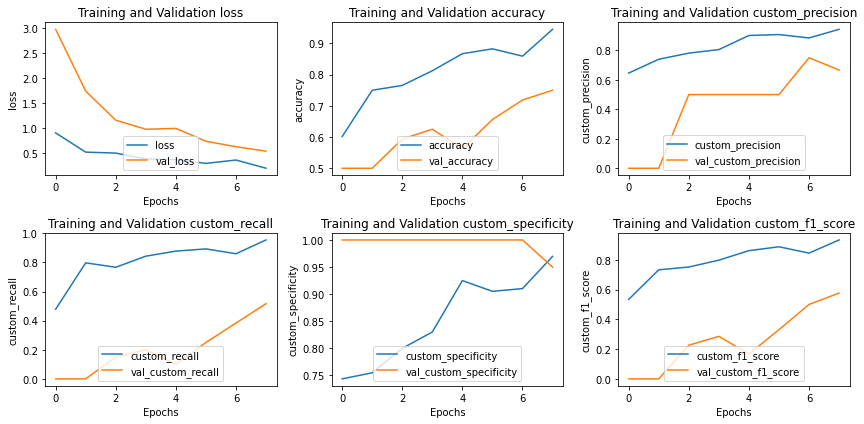

In [80]:
plot_metrics(history_ResNet50)

### Fine-Tuning of convolutional weights

Previously we did not re-train the original CNN. Instead, we treated the CNN as an arbitrary feature extractor and only trained a fully connected neural network for classification purposes. This is because, in the beginning the convolutional layers have already learned discriminative parameters while our classification layers are brand new and totally random. If we allow backpropagation from these random values all the way through the network, we risk destroying these powerful features. After several epochs the classification layers have 'warmed up' enough, such that we can further refine the weights of the model with fine tuning.

Fine-tuning is done by unfreezing the base model layers halfway through the training, compiling and then continuing the training, which allows the training of convolutional weights to adapt to our goal in medical imaging goal better. This second training phase is done with a very small learning rate, since we do not want to alter our convolutional filters drastically.

In [81]:
# Let's take a look to see how many layers are in the base model
print("Number of layers in the base model: ", len(base_model.layers))

# Allow the original CONV layers to be modified during the fine-tuning process (unfreeze base_model)
base_model.trainable = True

# Configure lower layers to so that they are not trainable 
fine_tune_at = 100
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

Number of layers in the base model:  175


It is important that in this fine-tuning step we resume training with a very small learning rate since we do not want to alter our convolution layers filters drastically.

In [82]:
base_learning_rate = 0.0001
opti = Adam(learning_rate=base_learning_rate/10)

model_ResNet50.compile(
    optimizer=opti,
    loss='binary_crossentropy',
    metrics=metrics,
)

model_ResNet50.summary()

total_epochs =  initial_epochs + fine_tune_epochs

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 dropout_9 (Dropout)         (None, 7, 7, 2048)        0         
                                                                 
 flatten_4 (Flatten)         (None, 100352)            0         
                                                                 
 batch_normalization_9 (Bat  (None, 100352)            401408    
 chNormalization)                                                
                                                                 
 dense_13 (Dense)            (None, 256)               25690368  
                                                                 
 batch_normalization_10 (Ba  (None, 256)               1024      
 tchNormalization)                                    

Now, the model is retrained with the augmented dataset, in order to improve the generalization and robustness which is seen before in the sense of overfitting.

In [83]:
# Retrain our model
history_fine_ResNet50 = model_ResNet50.fit(train_generator, 
                    epochs=total_epochs,
                    initial_epoch=history_densenet169.epoch[-1],
                    steps_per_epoch=16,
                    validation_data=val_generator, 
                    validation_steps=4, 
                    callbacks=[es])

Epoch 6/18
16/16 [==============================] - 30s 1s/step - loss: 0.9699 - accuracy: 0.4922 - custom_precision: 0.5521 - custom_recall: 0.3979 - custom_specificity: 0.5876 - custom_f1_score: 0.4303 - val_loss: 0.4546 - val_accuracy: 0.8125 - val_custom_precision: 0.8750 - val_custom_recall: 0.7417 - val_custom_specificity: 0.9643 - val_custom_f1_score: 0.7556
Epoch 7/18
16/16 [==============================] - 19s 1s/step - loss: 0.9378 - accuracy: 0.5391 - custom_precision: 0.5875 - custom_recall: 0.5312 - custom_specificity: 0.5844 - custom_f1_score: 0.5252 - val_loss: 0.5146 - val_accuracy: 0.8125 - val_custom_precision: 0.8458 - val_custom_recall: 0.8750 - val_custom_specificity: 0.7000 - val_custom_f1_score: 0.8544
Epoch 8/18
16/16 [==============================] - 19s 1s/step - loss: 0.8210 - accuracy: 0.5391 - custom_precision: 0.5437 - custom_recall: 0.4938 - custom_specificity: 0.6021 - custom_f1_score: 0.4930 - val_loss: 0.6931 - val_accuracy: 0.7500 - val_custom_preci

Now we will plot a comparison between predictions obatined for each image and true corresponding labels:

In [84]:
model_ResNet50.evaluate(test_generator)

5/5 [==============================] - 2s 342ms/step - loss: 0.7245 - accuracy: 0.6750 - custom_precision: 0.6333 - custom_recall: 0.3867 - custom_specificity: 0.8933 - custom_f1_score: 0.4721


[0.7244967818260193,
 0.675000011920929,
 0.6333333253860474,
 0.3866666853427887,
 0.8933333158493042,
 0.47206345200538635]

Now we plot a comparison between predictions obatined for each image and true corresponding labels.

2/2 [==============================] - 2s 444ms/step


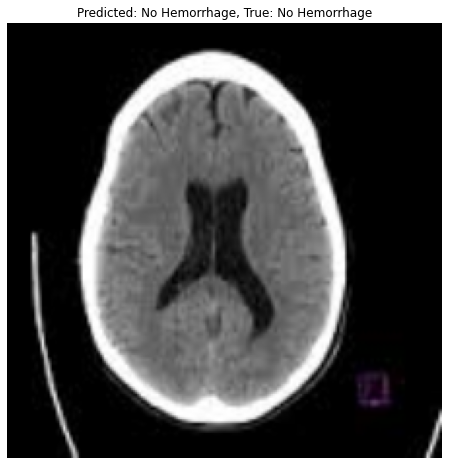

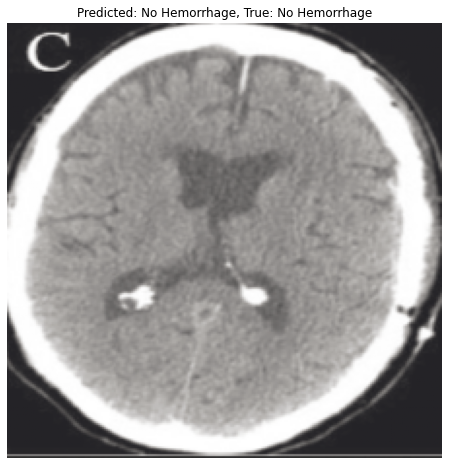

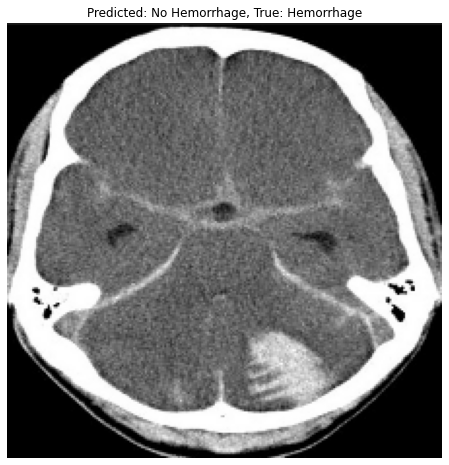

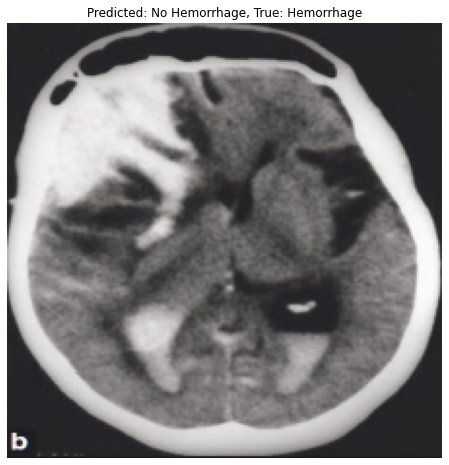

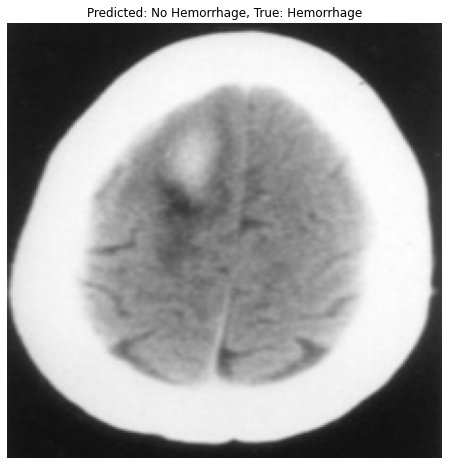

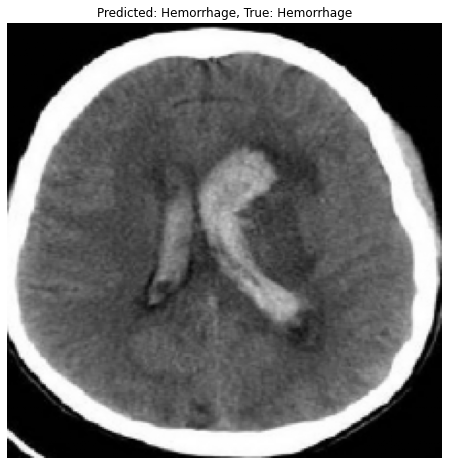

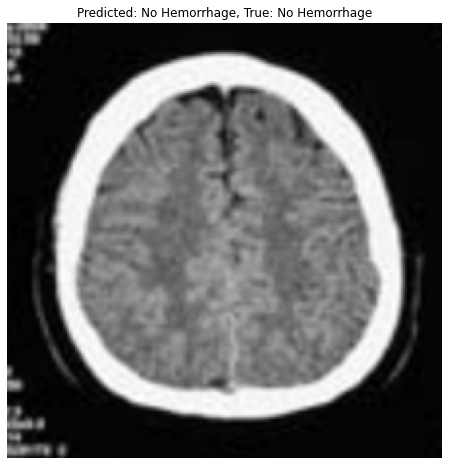

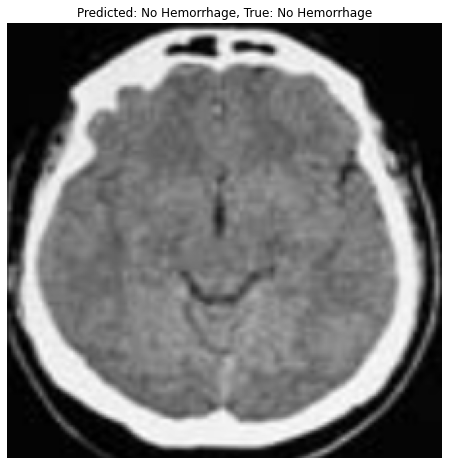

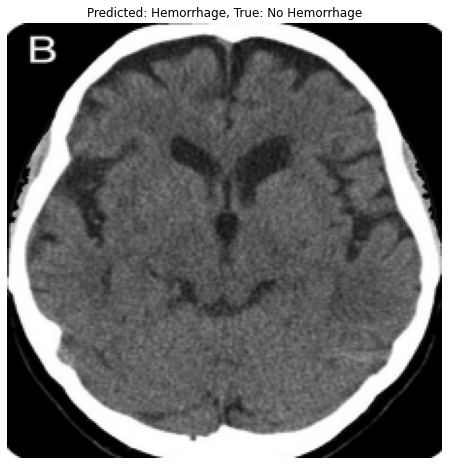

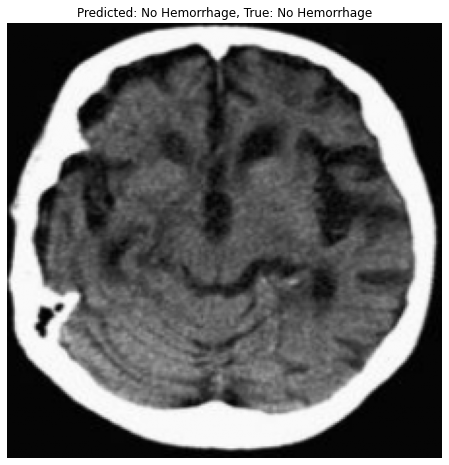

In [132]:
evaluate_predictions(model_ResNet50, images_test_norm, labels_test, num_images=10)

# 7. Building Personalized Network

Firstly, we have seen above, with simple CNN models, that data augmentation is beneficial for training the network with more data and hence obtaining better results by adding more variability to our dataset. So this will be implemented from the first moment.

In this section we will study what methods, architectures and number of parameters fit our dataset better for succesfully classifying CT images of the brain into those that present hemorrhage and those that do not.

Keras Tuner is a library that helps to choose the optimal set of hyperparameters for a TensorFlow program. The process of selecting the right set of hyperparameters for a machine or deep learning algorithm is called hyperparameter tuning.

Hyperparameters are the variables that govern the training process and the topology of an ML model. These variables remain constant during the training process and directly impact the performance of your ML program. Hyperparameters come in two types:

1. Model hyperparameters that influence the model selection, such as the number and width of hidden layers.
2. Algorithm hyperparameters that influence the speed and quality of the learning algorithm, such as the learning rate for stochastic gradient descent (SGD) and the number of nearest neighbors for a k-nearest neighbors (KNN) classifier.

### Model architecture:  Definition of the search space

Firstly the model architecture is defined with the two following functions, having one returning a compiled Keras model ('cnn_model') and other defining the search space ('build_model'), which takes an argument hp for defining the hyperparameters while building the model.

The search space for hyperparameter optimization is defined using the Keras Tuner library, which is essentially the set of hyperparameters that the optimization algorithm explores to find the best-performing neural network architecture.

Our hyperparameters include:

1. **Number of Convolutional Neurons (`nCNNn`):**
   - Hyperparameter type: Integer (Discrete).
   - Search space: Values between 1 and 10 (inclusive).
   - Explanation: Determines the number of convolutional neurons in the model.

```python
nCNNn = hp.Int("nCNNn", min_value=1, max_value=10, step=1)
```

**Convolutional Layer Hyperparameters (`hp_cnn` list):**

2. **Number of Filters (`nf_c`):**
   - Hyperparameter type: Integer (Discrete).
   - Search space: Values between 32 and 128 (inclusive).
   - Explanation: Determines the number of filters in a convolutional layer.

```python
hp.Int(f"nf_c", min_value=32, max_value=128, step=32)
```

3. **Kernel Size (`ks_c`):**
   - Hyperparameter type: Integer (Discrete).
   - Search space: Values between 3 and 7 (inclusive), with a step size of 2.
   - Explanation: Specifies the size of the convolutional kernel.

```python
hp.Int(f'ks_c', min_value=3, max_value=7, step=2)
```

4. **Pool Size (`ps_c`):**
   - Hyperparameter type: Integer (Discrete).
   - Search space: Values between 2 and 3 (inclusive).
   - Explanation: Determines the size of the pooling window.

```python
hp.Int(f'ps_c', min_value=2, max_value=3, step=1)
```

5. **Use Dropout (`dropout_c`):**
   - Hyperparameter type: Boolean.
   - Explanation: Specifies whether to include a dropout layer in the convolutional neuron.

```python
hp.Boolean(f"dropout_c")
```

6. **Dropout Rate (`dp_c`):**
   - Hyperparameter type: Float (Continuous).
   - Search space: Values between 0.1 and 0.8 (inclusive), with a step size of 0.1.
   - Explanation: Determines the dropout rate if dropout is included.

```python
hp.Float(f"dp_c", min_value=0.1, max_value=0.8, step=0.1)
```

7. **Number of Dense Neurons (`nDn`):**
   - Hyperparameter type: Integer (Discrete).
   - Search space: Values between 1 and 5 (inclusive).
   - Explanation: Determines the number of dense neurons in the model.

```python
nDn = hp.Int("nDn", min_value=1, max_value=5, step=1)
```

**Dense Layer Hyperparameters (`hp_dense` list):**

8. **Use Batch Normalization (`batchnorm_d`):**
   - Hyperparameter type: Boolean.
   - Explanation: Specifies whether to include batch normalization in the dense layer.

```python
hp.Boolean(f"batchnorm_d")
```

9. **Number of Units (`ds_d`):**
   - Hyperparameter type: Integer (Discrete).
   - Search space: Values between 32 and 512 (inclusive), with a step size of 32.
   - Explanation: Determines the number of units in the dense layer.

```python
hp.Int(f"ds_d", min_value=32, max_value=512, step=32)
```

10. **Learning Rate (`lr`):**
   - Hyperparameter type: Float (Continuous, log scale).
   - Search space: Values between \(1 \times 10^{-4}\) and \(1 \times 10^{-2}\).
   - Explanation: Determines the learning rate of the optimizer.

```python
hp.Float("lr", min_value=1e-4, max_value=1e-2, sampling="log")
```

In [150]:
def cnn_model(nCNNn, nDn, hp_cnn, hp_dense, lr):
    """
    Build and compile a convolutional neural network (CNN) model.

    Parameters:
    - nCNNn (int): Number of convolutional neurons.
    - nDn (int): Number of dense neurons.
    - hp_cnn (list): List of hyperparameters for convolutional layers.
    - hp_dense (list): List of hyperparameters for dense layers.
    - lr (float): Learning rate.

    Returns:
    - model (Sequential): Compiled Keras model.
    """

    # Create a Sequential model
    model = Sequential()
    
    # Iº NEURON - Convolutional Layers
    for i in range(nCNNn):
        
        # Add a Conv2D layer with specified filters, kernel size, input shape, padding, and activation function
        model.add(
            Conv2D(
                filters=hp_cnn[i][0],
                kernel_size=(hp_cnn[i][1], hp_cnn[i][1]),
                input_shape=(224, 224, 3),
                padding='same',
                activation='relu')
        )
        
        # Add a MaxPooling2D layer with specified pool size, strides, and padding
        model.add(
            MaxPool2D(pool_size=(hp_cnn[i][2], hp_cnn[i][2]), strides=2, padding='valid')
        )
        
        # Add a Dropout layer if specified in hyperparameters
        if hp_cnn[i][3]:
            model.add(Dropout(hp_cnn[i][4]))
            
        
    # CLASIFICATION NEURON - Flatten the output for dense layers
    model.add(Flatten())
    
    # Jº DENSE NEURON - Dense Layers
    for j in range(nDn):
        
        # Add BatchNormalization layer if specified in hyperparameters
        if hp_dense[j][0]:
            model.add(BatchNormalization())
        
        # Add a Dense layer with specified number of units and activation function
        model.add(Dense(hp_dense[j][1], activation='relu'))
    
    # Add BatchNormalization to the last Dense layer if specified
    if hp_dense[j][0]:
        model.add(BatchNormalization())
    
    # Output layer with a single unit and sigmoid activation for binary classification
    model.add(Dense(1, activation='sigmoid'))
        
    # Compile the model with binary crossentropy loss, Adam optimizer, and accuracy metric
    model.compile(loss='binary_crossentropy', optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
                  metrics=['accuracy'])

    print(model.summary())
    return model

In [151]:
def build_model(hp):
    """
    Build a Keras model with hyperparameters sampled by a tuner.

    Parameters:
    - hp (HyperParameter): Object containing hyperparameters sampled by the tuner.

    Returns:
    - model (Sequential): Compiled Keras model.
    """
    
    # Initialize lists to store hyperparameters for convolutional and dense layers
    hp_cnn = []
    hp_dense = []
    
    # NUMBER OF CONVOLUTION NEURONS - Sample number of convolutional neurons
    nCNNn = hp.Int("nCNNn", min_value=1, max_value=10, step=1)
    
    for i in range(nCNNn):
        
        # NUMBER OF FILTERS - Sample number of filters
        hp_cnn.append([
            hp.Int(f"nf_{i}", min_value=32, max_value=128, step=32)
        ])
        
        # KERNEL SIZE - Sample kernel size
        hp_cnn[-1].append(
            hp.Int(f'ks_{i}', min_value=3, max_value=7, step=2)
        )
        
        # POOL SIZE - Sample pool size
        hp_cnn[-1].append(
            hp.Int(f'ps_{i}', min_value=2, max_value=3, step=1)
        )
        
        # DROPOUT - Sample whether to include dropout and its rate
        hp_cnn[-1].append(
            
            hp.Boolean(f"dropout_{i}")
        )
        hp_cnn[-1].append(
            hp.Float(f"dp_{i}", min_value=0.1, max_value=0.8, step=0.1)
        )
        
    # NUMBER OF DENSE NEURONS - Sample number of dense neurons
    nDn = hp.Int("nDn", min_value=1, max_value=5, step=1)
    
    for j in range(nDn):
    
        # BATCHNORMALIZATION - Sample whether to include batch normalization
        hp_dense.append([
            hp.Boolean(f"batchnorm_{i}")
        ])
        
        # DENSE LAYER - Sample number of units in dense layer
        hp_dense[-1].append(
            hp.Int(f"ds_{i}", min_value=32, max_value=512, step=32)
        )
    
    
    # LEARNING RATE - Sample learning rate
    lr = hp.Float("lr", min_value=1e-4, max_value=1e-2, sampling="log")
    
    # Call existing model-building code with the hyperparameter values.
    model = cnn_model(
        nCNNn=nCNNn,
        nDn = nDn,
        hp_cnn=hp_cnn,
        hp_dense=hp_dense,
        lr=lr)
    
    return model

Each hyperparameter is uniquely identified by its name, provided as the first argument during definition. To customize the number of units in distinct convolutional or dense layers independently, they are assigned different names using the format f"units_{i}", allowing for individual tuning.

Importantly, this serves as an illustration of creating conditional hyperparameters, which could be beneficial. Numerous hyperparameters dictate the number of units in the convolotional or dense layers, and the count of such hyperparameters is determined by another hyperparameter, specifically, the number of layers. Consequently, the total count of hyperparameters may vary across trials. Certain hyperparameters are conditionally utilized based on predefined criteria. For instance, dropout (in the colvolutional layer part) or batchnormalization (in the dense layer part) are activated only when their activating hyperparameters are set as True. With KerasTuner, the dynamic definition of such conditional hyperparameters during model creation is straightforward.

Finally, the model is built succesfully.

In [152]:
build_model(keras_tuner.HyperParameters())

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 224, 224, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 112, 112, 32)      0         
 g2D)                                                            
                                                                 
 flatten_3 (Flatten)         (None, 401408)            0         
                                                                 
 dense_8 (Dense)             (None, 32)                12845088  
                                                                 
 dense_9 (Dense)             (None, 1)                 33        
                                                                 
Total params: 12846017 (49.00 MB)
Trainable params: 12846017 (49.00 MB)
Non-trainable params: 0 (0.00 Byte)
____________

### Start the search

After defining the search space, a tuner class is selected to run the search, choosing Hyperband. In order to initialize the tuner, several arguments in the initializer are specified.

- **build_model**: The model-building function. In this case, it refers to the function build_model that defines the Keras model architecture based on the hyperparameter configurations.

- **objective**: The name of the objective to optimize. In this case, it's set to 'val_accuracy', indicating that the tuner should maximize the validation accuracy during the hyperparameter search. The Hyperband tuner automatically infers whether to minimize or maximize based on the objective.

- **max_epochs**: The maximum number of epochs to train each model configuration. In this example, it's set to 10, meaning that each model will be trained for a maximum of 10 epochs during each trial.

- **factor**: The reduction factor for the number of configurations and resources at each successive halving. It controls the trade-off between the number of configurations explored and the resources allocated to each configuration. In this case, factor=3 indicates that the number of configurations is reduced by a factor of 3 at each halving iteration.

- **directory**: A path to a directory for storing the search results. The search results include information about each trial and its corresponding hyperparameter configurations, as well as the performance metrics.

- **project_name**: The name of the sub-directory in the specified directory. It helps organize and distinguish different hyperparameter search projects. In this example, the sub-directory is named 'cnn_hyperband'.

The Hyperband tuner combines random sampling of hyperparameter configurations with a successive halving procedure, allowing it to efficiently identify promising hyperparameter configurations and allocate resources more effectively than a pure random search. This approach is particularly useful when computational resources are limited, as it focuses more resources on configurations that show promise early in the search.

This tuner determines the quantity of trials by employing a tournament-style approach, training a substantial number of models for a limited number of epochs and advancing only half of the models with the best performance to the next round. The algorithm calculates the number of models to train in a group using the formula 1 + logarithmic factor ( max_epochs ) and rounding it to the nearest integer. This adaptive resource allocation strategy enable Hyperband to converge rapidly towards a high-performing model.

In [153]:
# Define the tuner
tuner = Hyperband(
    build_model,
    objective='val_accuracy',
    max_epochs=10,
    factor=3,
    directory='hyperband',
    project_name='cnn_hyperband'
)

Reloading Tuner from hyperband\cnn_hyperband\tuner0.json


And the summary of the search space is printed.

In [154]:
tuner.search_space_summary()

Search space summary
Default search space size: 71
nCNNn (Int)
{'default': None, 'conditions': [], 'min_value': 1, 'max_value': 10, 'step': 1, 'sampling': 'linear'}
nf_0 (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 128, 'step': 32, 'sampling': 'linear'}
ks_0 (Int)
{'default': None, 'conditions': [], 'min_value': 3, 'max_value': 7, 'step': 2, 'sampling': 'linear'}
ps_0 (Int)
{'default': None, 'conditions': [], 'min_value': 2, 'max_value': 3, 'step': 1, 'sampling': 'linear'}
dropout_0 (Boolean)
{'default': False, 'conditions': []}
dp_0 (Float)
{'default': 0.1, 'conditions': [], 'min_value': 0.1, 'max_value': 0.8, 'step': 0.1, 'sampling': 'linear'}
nDn (Int)
{'default': None, 'conditions': [], 'min_value': 1, 'max_value': 5, 'step': 1, 'sampling': 'linear'}
batchnorm_0 (Boolean)
{'default': False, 'conditions': []}
ds_0 (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': 'linear'}
lr (Float)
{'default': 0.0001, 'c

Finally, the search is started for the best hyperparameter configuration, passing validation data in order to evaluate the model during the search. 

It is also important to highligh that the search is initiated with the original dataset instead of the augmented dataset as is beneficial because hyperparameters should capture inherent patterns in the original one. Augmentation introduces variations that are designed to improve generalization, but tuning hyperparameters on augmented data may lead to overfitting to augmented patterns that do not generalize well to unseen data. Therefore, optimizing hyperparameters on the original data provides a more robust and generalizable model.

In [155]:
# Perform the hyperparameter search
tuner.search(images_train_norm,labels_train, 
             epochs=10,
             batch_size=8,
             validation_data=(images_val_norm, labels_val))

During the search, the model-building function is called with different hyperparameter values in different trials. In each trial, the tuner would generate a new set of hyperparameter values to build the model. The model is then fit and evaluated. The metrics are recorded. The tuner progressively explores the space and finally finds a good set of hyperparameter values. Furthermore, the results summary can be printed.

In [156]:
tuner.results_summary()

Results summary
Results in hyperband\cnn_hyperband
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 0020 summary
Hyperparameters:
nCNNn: 1
nf_0: 128
ks_0: 3
ps_0: 3
dropout_0: False
dp_0: 0.7000000000000001
nDn: 1
batchnorm_0: False
ds_0: 160
lr: 0.0009377013211553278
nf_1: 128
ks_1: 3
ps_1: 2
dropout_1: True
dp_1: 0.4
nf_2: 128
ks_2: 7
ps_2: 2
dropout_2: False
dp_2: 0.1
nf_3: 32
ks_3: 5
ps_3: 3
dropout_3: True
dp_3: 0.2
nf_4: 96
ks_4: 3
ps_4: 3
dropout_4: False
dp_4: 0.8
nf_5: 128
ks_5: 3
ps_5: 3
dropout_5: True
dp_5: 0.2
nf_6: 32
ks_6: 7
ps_6: 3
dropout_6: False
dp_6: 0.30000000000000004
nf_7: 96
ks_7: 5
ps_7: 3
dropout_7: True
dp_7: 0.5
batchnorm_7: True
ds_7: 128
nf_8: 128
ks_8: 5
ps_8: 2
dropout_8: False
dp_8: 0.5
batchnorm_8: True
ds_8: 224
batchnorm_5: True
ds_5: 512
batchnorm_2: False
ds_2: 416
batchnorm_6: True
ds_6: 512
batchnorm_4: True
ds_4: 64
batchnorm_1: True
ds_1: 128
nf_9: 32
ks_9: 7
ps_9: 3
dropout_9: True
dp_9: 0.30000000000000004
batchno

### Query the results

When search is over, the best model(s) can be retrieved. The model is saved at its best performing epoch evaluated on the validation_data.

In [157]:
# Get the top 2 models.
models = tuner.get_best_models(num_models=2)
best_model = models[0]
# Build the model.
# Needed for `Sequential` without specified `input_shape`.
best_model.build(input_shape=(None, 28, 28))
best_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 128)     3584      
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 128)     0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 1577088)           0         
                                                                 
 dense (Dense)               (None, 160)               252334240 
                                                                 
 dense_1 (Dense)             (None, 1)                 161       
                                                                 
Total params: 252337985 (962.59 MB)
Trainable params: 252337985 (962.59 MB)
Non-trainable params: 0 (0.00 Byte)
__________

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 128)     3584      
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 128)     0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 1577088)           0         
                                                                 
 dense (Dense)               (None, 160)               252334240 
                                                                 
 dense_1 (Dense)             (None, 1)                 161       
                                                                 
Total params: 252337985 (962.59 MB)
Trainable params: 252337985 (962.59 MB)
Non-trainable params: 0 (0.00 Byte)
__________

### Train the model

In order to train the model, some callbacks are defined:
- The **EarlyStopping** callback monitors a specified metric (in this case, 'val_accuracy') during training and stops the training process if the metric stops improving.
- The **ModelCheckpoint** callback saves the model's weights to a file whenever there is an improvement in a specified metric.
- **ReduceLROnPlateau** reduces the learning rate when a monitored metric (e.g., validation loss) has stopped improving.
- **Tensorboard** enables the use of TensorBoard for visualizing training metrics.

These callbacks enhance the training process by introducing flexibility and control, allowing you to respond to different scenarios during model training.

In [158]:
# Setting an early stopping callback
stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=15)

# Setting a model checkpoint
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath='best_model.h5', save_best_only=True)

# Setting a reduce learning rate
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-7)

# Setting Tesorboard
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir='./logs')

Also, the best hyperparameters are retrieved in order to train the model.

In [159]:
# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters()[0]
print(best_hps.values)

{'nCNNn': 1, 'nf_0': 128, 'ks_0': 3, 'ps_0': 3, 'dropout_0': False, 'dp_0': 0.7000000000000001, 'nDn': 1, 'batchnorm_0': False, 'ds_0': 160, 'lr': 0.0009377013211553278, 'nf_1': 128, 'ks_1': 3, 'ps_1': 2, 'dropout_1': True, 'dp_1': 0.4, 'nf_2': 128, 'ks_2': 7, 'ps_2': 2, 'dropout_2': False, 'dp_2': 0.1, 'nf_3': 32, 'ks_3': 5, 'ps_3': 3, 'dropout_3': True, 'dp_3': 0.2, 'nf_4': 96, 'ks_4': 3, 'ps_4': 3, 'dropout_4': False, 'dp_4': 0.8, 'nf_5': 128, 'ks_5': 3, 'ps_5': 3, 'dropout_5': True, 'dp_5': 0.2, 'nf_6': 32, 'ks_6': 7, 'ps_6': 3, 'dropout_6': False, 'dp_6': 0.30000000000000004, 'nf_7': 96, 'ks_7': 5, 'ps_7': 3, 'dropout_7': True, 'dp_7': 0.5, 'batchnorm_7': True, 'ds_7': 128, 'nf_8': 128, 'ks_8': 5, 'ps_8': 2, 'dropout_8': False, 'dp_8': 0.5, 'batchnorm_8': True, 'ds_8': 224, 'batchnorm_5': True, 'ds_5': 512, 'batchnorm_2': False, 'ds_2': 416, 'batchnorm_6': True, 'ds_6': 512, 'batchnorm_4': True, 'ds_4': 64, 'batchnorm_1': True, 'ds_1': 128, 'nf_9': 32, 'ks_9': 7, 'ps_9': 3, 'dropo

With the best hyperparameters, the model can be know trained, with the original dataset, following the previous approach done in transfer learning. A first train with the original dataset and then retrain the model with the augmented one.

In this case, the number of epochs is increased allows the model to undergo more training iterations, potentially improving its ability to learn complex patterns and achieve better performance, which is guarded by the early stopping callback in case the performance of the model gets stuck.

In [160]:
# Build the model with the optimal hyperparameters and train it on the data for 50 epochs
model = tuner.hypermodel.build(best_hps)
history = model.fit(images_train_norm,
                    labels_train, 
                    epochs=50, 
                    batch_size=8,
                    validation_data = (images_val_norm, labels_val),
                    callbacks = [stop_early, model_checkpoint, reduce_lr, tensorboard_callback])

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 224, 224, 128)     3584      
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 111, 111, 128)     0         
 g2D)                                                            
                                                                 
 flatten_1 (Flatten)         (None, 1577088)           0         
                                                                 
 dense_4 (Dense)             (None, 160)               252334240 
                                                                 
 dense_5 (Dense)             (None, 1)                 161       
                                                                 
Total params: 252337985 (962.59 MB)
Trainable params: 252337985 (962.59 MB)
Non-trainable params: 0 (0.00 Byte)
________

Using the the following function, the metrics for training and validation are plotted.

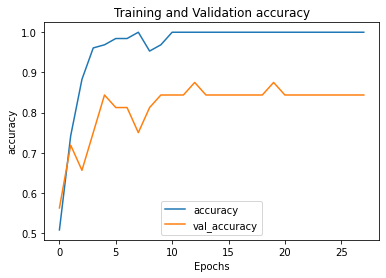

In [161]:
# Vizualizing the results of the model
plot_metrics(history, method = 'accuracy')

The best epoch is computed, so a new hypermodel can be retrained with the optimal number of epochs as well as with the augmented dataset, in order to improve the generalization and robustness which is seen before in the sense of overfitting.

In [162]:
val_acc_per_epoch = history.history['val_accuracy']
best_epoch = val_acc_per_epoch.index(max(val_acc_per_epoch)) + 1
print('Best epoch: %d' % (best_epoch,))

Best epoch: 13


In [163]:
hypermodel = tuner.hypermodel.build(best_hps)

# Retrain the model
history_fined = hypermodel.fit(train_generator, 
               epochs=best_epoch, 
               steps_per_epoch=16,
               validation_data=val_generator, 
               validation_steps=4)

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 224, 224, 128)     3584      
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 111, 111, 128)     0         
 g2D)                                                            
                                                                 
 flatten_2 (Flatten)         (None, 1577088)           0         
                                                                 
 dense_6 (Dense)             (None, 160)               252334240 
                                                                 
 dense_7 (Dense)             (None, 1)                 161       
                                                                 
Total params: 252337985 (962.59 MB)
Trainable params: 252337985 (962.59 MB)
Non-trainable params: 0 (0.00 Byte)
________

### Model evaluation

Finally the model is evaluated.

In [164]:
evaluacion = model.evaluate(test_generator)

5/5 [==============================] - 3s 308ms/step - loss: 0.9294 - accuracy: 0.7250


Also, the different images are plotted with the predicted and true label, in order to see where our model is right and where the model is wrong.

2/2 [==============================] - 1s 312ms/step


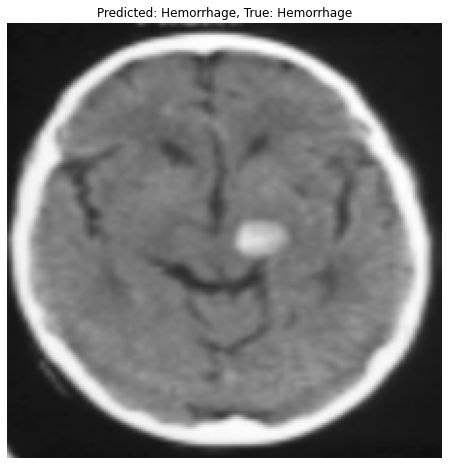

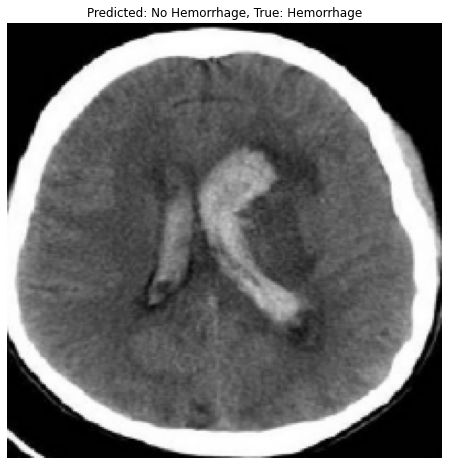

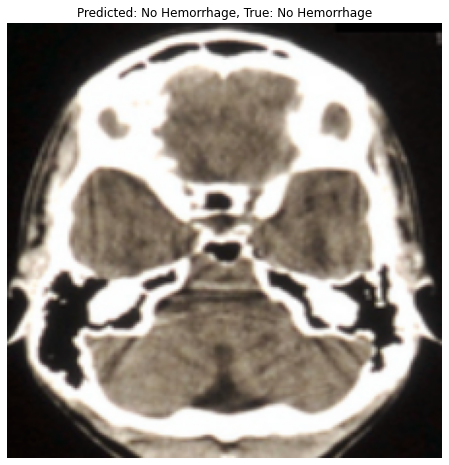

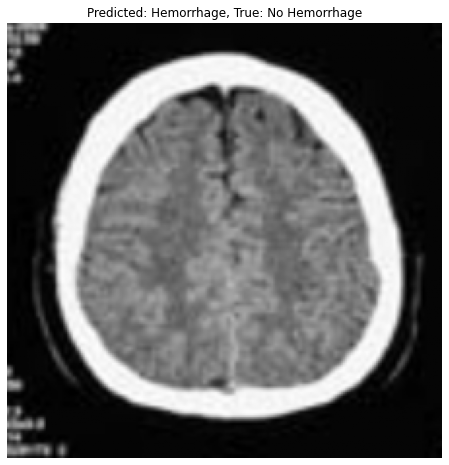

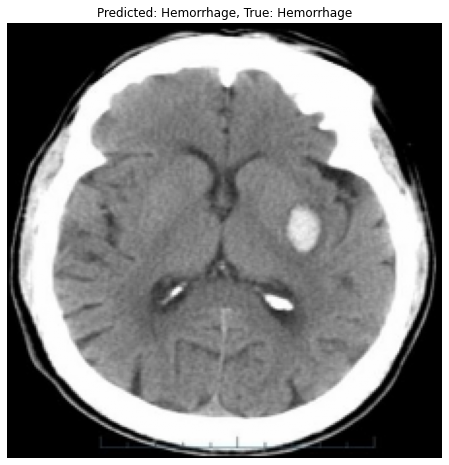

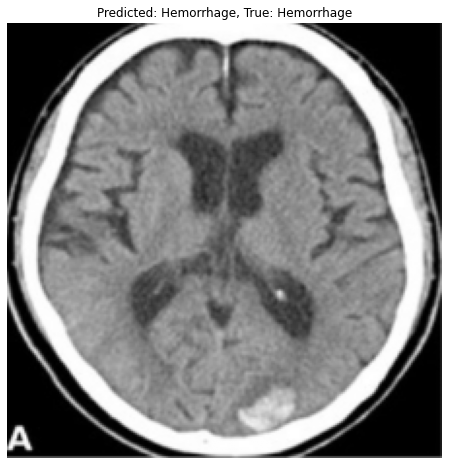

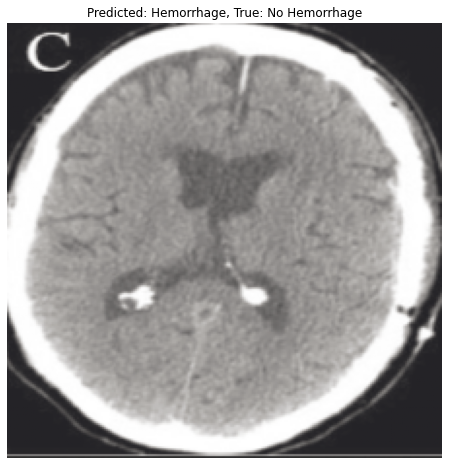

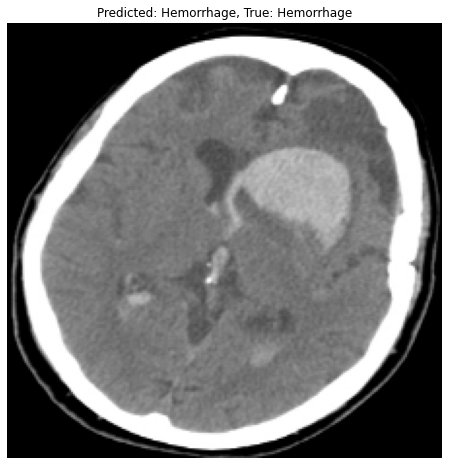

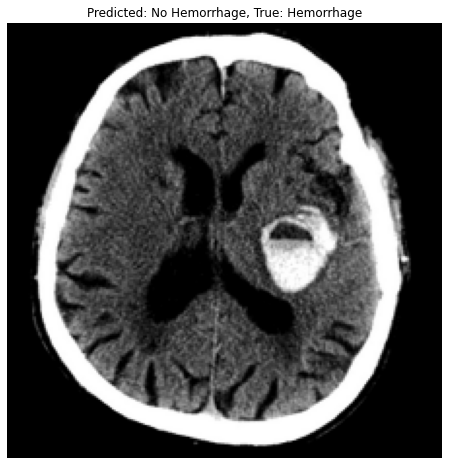

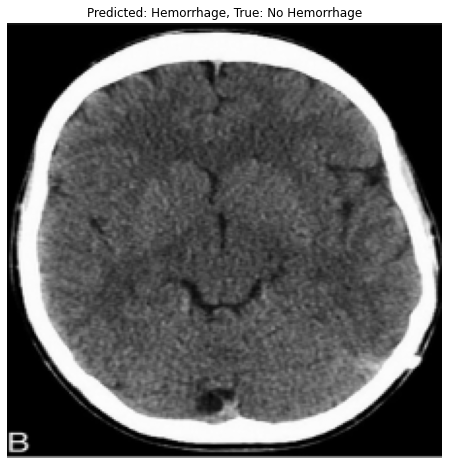

In [165]:
evaluate_predictions(model, images_test_norm, labels_test, num_images=10)

# 8. Conclusion

In this project, we aimed to leverage Convolutional Neural Networks (CNNs) for the classification of brain CT slices into two classes: healthy brains (labeled 0) and brains with bleeding (labeled 1). We explored several pre-trained architectures applying the powerful technique of Transfer Learning to enhance model performance, and implemented a personalized network.

**Model Performance (Accuracy):**

1. **Simple CNN Network (Class Example): 0.5**
   - This baseline model demonstrated limited effectiveness, achieving an accuracy of 0.5.

2. **VGG16: 0.95**
   - VGG16, known for its uniform structure, outperformed the baseline significantly with an accuracy of 0.95. This indicates the successful transfer of learned features from a pre-trained model.

3. **DenseNet169: 0.875**
   - DenseNet169, a more elaborate architecture with dense connectivity, performed well with an accuracy of 0.875. However, it fell slightly short compared to VGG16.

4. **ResNet50: 0.675**
   - ResNet50, despite its skip connections, showed comparatively lower accuracy (0.675). The complexity introduced by skip connections may have hindered effective transfer learning in the medical imaging context.

5. **Personalized Network: 0.725**
   - The personalized network achieved an accuracy of 0.725, demonstrating the effectiveness of a customized approach. While not surpassing VGG16, it showcased the value of crafting models tailored to specific task requirements.

**Transfer Learning Impact:**

This project underscores the significance of Transfer Learning in medical image classification tasks. Leveraging pre-trained models, especially those with architectures suitable for feature transferability like VGG16, significantly improves model performance. The exploration of various architectures and the implementation of a personalized network highlight the importance of model design tailored to the intricacies of medical imaging datasets.

- **VGG16 Dominance:**
  - Transfer learning, particularly with VGG16, emerged as the most effective strategy. VGG16's uniform structure facilitated superior transferability of learned features to the medical image domain.

- **Challenges with ResNet and DenseNet:**
  - ResNet and DenseNet, despite their architectural intricacies, faced challenges in effective transfer learning for our medical imaging scenario. The additional complexities introduced by skip connections and dense connectivity may not have translated well to the specific features present in our dataset.

**Personalized Model: A Tailored Approach**

The introduction of a personalized neural network aimed to address the specific nuances of our brain CT image classification task. While not surpassing the accuracy achieved by the VGG16 model, the personalized network showcased the value of a task-specific design. This approach allowed us to fine-tune the model architecture to better capture the unique features present in our dataset, potentially contributing to enhanced interpretability and domain-specific performance.